In [1]:
from keras.models import Model
from keras.layers import Input, Conv2D, MaxPooling2D, UpSampling2D, concatenate, Conv2DTranspose, BatchNormalization, Dropout, Lambda

In [2]:
import cv2

In [2]:
from keras.utils import normalize
import os
import glob
import cv2
import numpy as np
from matplotlib import pyplot as plt

In [3]:
import glob
import os
import rasterio

In [5]:
import cv2

In [4]:
#Resizing images, if needed
SIZE_X = 64
SIZE_Y = 64
n_classes=6 #Number of classes for segmentation

In [5]:
train_nir="D:/Jintu/Jintu_LULC/TestDL_5/Data Preparation/Patchify/64_patches/nir/"
train_mask="D:/Jintu/Jintu_LULC/TestDL_5/Data Preparation/Patchify/64_patches/lulc/"
train_ndvi="D:/Jintu/Jintu_LULC/TestDL_5/Data Preparation/Patchify/64_patches/ndvi/"
train_evi="D:/Jintu/Jintu_LULC/TestDL_5/Data Preparation/Patchify/64_patches/evi/"
train_ndwi="D:/Jintu/Jintu_LULC/TestDL_5/Data Preparation/Patchify/64_patches/ndwi/"
train_red="D:/Jintu/Jintu_LULC/TestDL_5/Data Preparation/Patchify/64_patches/red/"
train_swir="D:/Jintu/Jintu_LULC/TestDL_5/Data Preparation/Patchify/64_patches/swir/"
train_tir="D:/Jintu/Jintu_LULC/TestDL_5/Data Preparation/Patchify/64_patches/tirs/"
train_cont="D:/Jintu/Jintu_LULC/TestDL_5/Data Preparation/Patchify/64_patches/contrast/"
train_diss="D:/Jintu/Jintu_LULC/TestDL_5/Data Preparation/Patchify/64_patches/dissimilarity/"
train_corr="D:/Jintu/Jintu_LULC/TestDL_5/Data Preparation/Patchify/64_patches/correlation/"
train_slp="D:/Jintu/Jintu_LULC/TestDL_5/Data Preparation/Patchify/64_patches/slope/"
train_asp="D:/Jintu/Jintu_LULC/TestDL_5/Data Preparation/Patchify/64_patches/aspect/"
train_elv="D:/Jintu/Jintu_LULC/TestDL_5/Data Preparation/Patchify/64_patches/elevation/"

In [6]:
#converted to numpy array ndwi evi, images labels and ndvi

In [7]:
#Capture training image info as a list
train_ndwis = []
# Assuming train_image is the directory pattern you want to search
for directory_path in glob.glob(train_ndwi):
    for img_path in glob.glob(os.path.join(directory_path, "*.tif")):
        with rasterio.open(img_path) as src:
            img = src.read(1)  # Read the image as a numpy array (assuming it's a single-band image)
            train_ndwis.append(img)

C:\Users\mrg22-020914479\.conda\envs\TestDL\Lib\site-packages\rasterio\__init__.py:319: NotGeoreferencedWarning: Dataset has no geotransform, gcps, or rpcs. The identity matrix will be returned.
  dataset = DatasetReader(path, driver=driver, sharing=sharing, **kwargs)


In [8]:
#Convert list to array for machine learning processing        
train_ndwis = np.array(train_ndwis)
print(train_ndwis)

[[[ 0.3291682   0.27968127  0.3567867  ...  0.32540697  0.35557264
    0.35557264]
  [ 0.23272586  0.2771192   0.2735982  ...  0.35730118  0.3415681
    0.33439717]
  [ 0.23069175  0.23069175  0.2917826  ...  0.34138244  0.33800027
    0.37672454]
  ...
  [ 0.56160396  0.54388714  0.5873753  ...  0.48962024  0.4733302
    0.4269691 ]
  [ 0.57008964  0.4806313   0.5158325  ...  0.46572718  0.43419653
    0.4806196 ]
  [ 0.54991084  0.47928995  0.4896868  ...  0.44864866  0.45850757
    0.47351563]]

 [[ 0.324511    0.37125894  0.36278826 ...  0.22416994  0.23662326
    0.2684797 ]
  [ 0.33100942  0.3402877   0.36278826 ...  0.2748493   0.22477587
    0.27924204]
  [ 0.2951677   0.34788033  0.35102805 ...  0.2733478   0.26654866
    0.24085073]
  ...
  [ 0.410156    0.4633826   0.44020358 ...  0.5152062   0.4372523
    0.4372523 ]
  [ 0.4513695   0.5215805   0.45291543 ...  0.41878876  0.46264857
    0.41713902]
  [ 0.4449294   0.4449294   0.48188654 ...  0.42289495  0.39005998
    0.423

In [9]:
#Capture training image info as a list
train_evis = []
# Assuming train_image is the directory pattern you want to search
for directory_path in glob.glob(train_evi):
    for img_path in glob.glob(os.path.join(directory_path, "*.tif")):
        with rasterio.open(img_path) as src:
            img = src.read(1)  # Read the image as a numpy array (assuming it's a single-band image)
            train_evis.append(img)

In [10]:
#Convert list to array for machine learning processing        
train_evis = np.array(train_evis)

In [11]:
print(train_evis)

[[[0.2867821  0.25186602 0.18628574 ... 0.7036665  0.7235781  0.7235781 ]
  [0.2200026  0.20242985 0.16164716 ... 0.72233285 0.68243372 0.59582572]
  [0.27144935 0.27144935 0.26028501 ... 0.71595706 0.71587411 0.73948222]
  ...
  [0.33484991 0.34978711 0.31048573 ... 0.85826638 0.88331715 0.83002497]
  [0.34879228 0.33141303 0.39859031 ... 0.89799472 0.86548575 0.8026531 ]
  [0.30658626 0.32398352 0.34786702 ... 0.87073648 0.88251685 0.88521357]]

 [[0.61974815 0.66249294 0.81785256 ... 0.5567621  0.48813152 0.4250376 ]
  [0.68484596 0.76570486 0.81785256 ... 0.39636823 0.29869165 0.29909153]
  [0.70721504 0.80358777 0.78398673 ... 0.32836386 0.28410265 0.24908054]
  ...
  [0.85113566 0.83910454 0.87100484 ... 0.20747114 0.23116952 0.23116952]
  [0.80765049 0.83537677 0.7948866  ... 0.28722791 0.30343089 0.37484208]
  [0.84057215 0.84057215 0.85510145 ... 0.32601911 0.31429213 0.42013718]]

 [[0.67487525 0.68693417 0.62937906 ... 0.44580288 0.38953906 0.36325078]
  [0.62392095 0.670637

In [12]:
#Capture training image info as a list
train_masks = []
# Assuming train_image is the directory pattern you want to search
for directory_path in glob.glob(train_mask):
    for img_path in glob.glob(os.path.join(directory_path, "*.tif")):
        with rasterio.open(img_path) as src:
            img = src.read(1)  # Read the image as a numpy array (assuming it's a single-band image)
            train_masks.append(img)

In [13]:
#Convert list to array for machine learning processing        
train_masks = np.array(train_masks)

In [14]:
print(train_masks.shape)

(900, 64, 64)


In [23]:
print(train_images)

NameError: name 'train_images' is not defined

In [15]:
#Capture training image info as a list
train_nirs = []
# Assuming train_image is the directory pattern you want to search
for directory_path in glob.glob(train_nir):
    for img_path in glob.glob(os.path.join(directory_path, "*.tif")):
        with rasterio.open(img_path) as src:
            img = src.read(1)  # Read the image as a numpy array (assuming it's a single-band image)
            train_nirs.append(img)

In [16]:
#Convert list to array for machine learning processing        
train_nirs = np.array(train_nirs)
print(train_nirs)
print(train_nirs.shape)

[[[0.12693109 0.10950917 0.08349562 ... 0.319254   0.33111864 0.33111864]
  [0.11070245 0.09733769 0.07705191 ... 0.3340166  0.30363905 0.25658965]
  [0.12495364 0.12495364 0.11871448 ... 0.32385665 0.3225611  0.35552976]
  ...
  [0.12812436 0.13432942 0.11660067 ... 0.4012154  0.42566064 0.3903736 ]
  [0.13136327 0.12314668 0.15178543 ... 0.443253   0.41352326 0.36009833]
  [0.11857811 0.1235899  0.13296568 ... 0.42487648 0.42214897 0.42347863]]

 [[0.27128407 0.2913312  0.3959309  ... 0.25832844 0.21550667 0.18049239]
  [0.30592334 0.3526318  0.3959309  ... 0.169446   0.12809026 0.12659015]
  [0.31662878 0.3864528  0.36964458 ... 0.1399208  0.12198748 0.1103956 ]
  ...
  [0.38675964 0.37980452 0.39558995 ... 0.08577991 0.09273504 0.09273504]
  [0.3540978  0.37680426 0.34533572 ... 0.11302082 0.11748711 0.14489849]
  [0.3837594  0.3837594  0.40653405 ... 0.12819254 0.12253299 0.1623886 ]]

 [[0.28550118 0.29064932 0.26156735 ... 0.536704   0.5892425  0.6747497 ]
  [0.2590444  0.282398

In [17]:
#Capture training image info as a list
train_ndvis = []
# Assuming train_image is the directory pattern you want to search
for directory_path in glob.glob(train_ndvi):
    for img_path in glob.glob(os.path.join(directory_path, "*.tif")):
        with rasterio.open(img_path) as src:
            img = src.read(1)  # Read the image as a numpy array (assuming it's a single-band image)
            train_ndvis.append(img)

In [18]:
#Convert list to array for machine learning processing        
train_ndvis = np.array(train_ndvis)
print(train_ndvis)
print(train_ndvis.shape)

[[[0.52363414 0.5093985  0.46296296 ... 0.7497898  0.7568741  0.7568741 ]
  [0.42100656 0.42643017 0.42496848 ... 0.7547913  0.7435396  0.71630555]
  [0.49014026 0.49014026 0.4937795  ... 0.75193655 0.7530109  0.7477583 ]
  ...
  [0.59880877 0.6131013  0.5910677  ... 0.79760176 0.7986026  0.7844619 ]
  [0.615175   0.6053333  0.6409878  ... 0.79609036 0.7929047  0.79108024]
  [0.5773242  0.59095895 0.6095749  ... 0.7885899  0.79957855 0.79806024]]

 [[0.7286552  0.7469079  0.7643573  ... 0.6763274  0.6605806  0.64078724]
  [0.7389535  0.7594625  0.7643573  ... 0.621269   0.556338   0.56303936]
  [0.74682593 0.76530135 0.75906545 ... 0.5796766  0.5489178  0.5113185 ]
  ...
  [0.79863644 0.80215156 0.81070536 ... 0.5065868  0.53628916 0.53628916]
  [0.7945572  0.8005865  0.7960812  ... 0.58120674 0.5990719  0.64696765]
  [0.7896494  0.7896494  0.7949722  ... 0.6099336  0.60518086 0.6741652 ]]

 [[0.7449469  0.74943566 0.72948605 ... 0.1695828  0.1340179  0.11210386]
  [0.7305546  0.743606

In [19]:
#Capture training image info as a list
train_reds = []
# Assuming train_image is the directory pattern you want to search
for directory_path in glob.glob(train_red):
    for img_path in glob.glob(os.path.join(directory_path, "*.tif")):
        with rasterio.open(img_path) as src:
            img = src.read(1)  # Read the image as a numpy array (assuming it's a single-band image)
            train_reds.append(img)

In [20]:
#Convert list to array for machine learning processing        
train_reds = np.array(train_reds)
print(train_reds)
print(train_reds.shape)

[[[0.03968514 0.03559389 0.03065029 ... 0.04565155 0.04582202 0.04582202]
  [0.04510605 0.03913964 0.03109351 ... 0.04667436 0.04466283 0.04241264]
  [0.04275358 0.04275358 0.04023064 ... 0.04585611 0.04544699 0.05131111]
  ...
  [0.03215042 0.03221861 0.02996842 ... 0.04517424 0.04766308 0.04715167]
  [0.03129807 0.03027526 0.03320733 ... 0.05032239 0.04776536 0.04200352]
  [0.03177539 0.03177539 0.0322527  ... 0.05022011 0.0470153  0.0475608 ]]

 [[0.04258311 0.04220808 0.05287943 ... 0.04987917 0.04404914 0.03951467]
  [0.0459243  0.04820858 0.05287943 ... 0.03958286 0.03651442 0.03538933]
  [0.0458902  0.0513793  0.05062924 ... 0.03723039 0.0355257  0.03569617]
  ...
  [0.04329908 0.04169667 0.04135574 ... 0.02809326 0.02799098 0.02799098]
  [0.04053748 0.04173077 0.03920783 ... 0.02993432 0.02945701 0.03105942]
  [0.04510605 0.04510605 0.04643571 ... 0.03105942 0.03013889 0.03160492]]

 [[0.04173077 0.04162848 0.04091252 ... 0.381066   0.4499695  0.53871554]
  [0.04033292 0.041526

In [21]:
#Capture training image info as a list
train_swirs = []
# Assuming train_image is the directory pattern you want to search
for directory_path in glob.glob(train_swir):
    for img_path in glob.glob(os.path.join(directory_path, "*.tif")):
        with rasterio.open(img_path) as src:
            img = src.read(1)  # Read the image as a numpy array (assuming it's a single-band image)
            train_swirs.append(img)
            

#Convert list to array for machine learning processing        
train_swirs = np.array(train_swirs)
print(train_swirs)
print(train_swirs.shape)            

[[[0.12693109 0.10950917 0.08349562 ... 0.319254   0.33111864 0.33111864]
  [0.11070245 0.09733769 0.07705191 ... 0.3340166  0.30363905 0.25658965]
  [0.12495364 0.12495364 0.11871448 ... 0.32385665 0.3225611  0.35552976]
  ...
  [0.12812436 0.13432942 0.11660067 ... 0.4012154  0.42566064 0.3903736 ]
  [0.13136327 0.12314668 0.15178543 ... 0.443253   0.41352326 0.36009833]
  [0.11857811 0.1235899  0.13296568 ... 0.42487648 0.42214897 0.42347863]]

 [[0.27128407 0.2913312  0.3959309  ... 0.25832844 0.21550667 0.18049239]
  [0.30592334 0.3526318  0.3959309  ... 0.169446   0.12809026 0.12659015]
  [0.31662878 0.3864528  0.36964458 ... 0.1399208  0.12198748 0.1103956 ]
  ...
  [0.38675964 0.37980452 0.39558995 ... 0.08577991 0.09273504 0.09273504]
  [0.3540978  0.37680426 0.34533572 ... 0.11302082 0.11748711 0.14489849]
  [0.3837594  0.3837594  0.40653405 ... 0.12819254 0.12253299 0.1623886 ]]

 [[0.28550118 0.29064932 0.26156735 ... 0.536704   0.5892425  0.6747497 ]
  [0.2590444  0.282398

In [22]:
#Capture training image info as a list
train_tirs = []
# Assuming train_image is the directory pattern you want to search
for directory_path in glob.glob(train_tir):
    for img_path in glob.glob(os.path.join(directory_path, "*.tif")):
        with rasterio.open(img_path) as src:
            img = src.read(1)  # Read the image as a numpy array (assuming it's a single-band image)
            train_tirs.append(img)
            

#Convert list to array for machine learning processing        
train_tirs = np.array(train_tirs)
print(train_tirs)
print(train_tirs.shape)      

[[[277.59445 277.5293  277.54233 ... 280.89877 281.01205 281.01205]
  [277.60095 277.5684  277.75064 ... 281.0341  281.05295 281.14093]
  [277.77338 277.77338 277.87735 ... 281.22256 281.21945 281.232  ]
  ...
  [282.32135 282.24683 282.2872  ... 284.8419  285.0053  285.1866 ]
  [282.11313 282.1909  282.33377 ... 285.0718  285.2047  285.34647]
  [281.99484 282.194   282.4579  ... 285.36456 285.51816 285.71356]]

 [[281.16293 281.2163  281.2728  ... 278.17886 278.072   277.965  ]
  [281.25397 281.29474 281.2728  ... 277.74088 277.64655 277.60095]
  [281.2728  281.29474 281.25082 ... 277.4021  277.32703 277.3107 ]
  ...
  [285.38565 285.58133 285.7526  ... 278.1821  278.61166 278.61166]
  [285.5001  285.68353 285.87265 ... 278.3955  278.4988  278.8595 ]
  [285.89362 285.89362 286.11227 ... 278.8434  279.00082 279.40125]]

 [[282.31204 282.06024 281.68915 ... 276.33902 275.3407  274.71515]
  [281.69852 281.45145 281.1378  ... 277.26495 276.121   275.15045]
  [281.1912  280.95227 280.66864

In [23]:
#Capture training image info as a list
train_conts = []
# Assuming train_image is the directory pattern you want to search
for directory_path in glob.glob(train_cont):
    for img_path in glob.glob(os.path.join(directory_path, "*.tif")):
        with rasterio.open(img_path) as src:
            img = src.read(1)  # Read the image as a numpy array (assuming it's a single-band image)
            train_conts.append(img)
            

#Convert list to array for machine learning processing        
train_conts = np.array(train_conts)
print(train_conts)
print(train_conts.shape) 

[[[     0.              0.              0.         ...      0.
        0.              0.        ]
  [     0.              0.              0.         ...      0.
        0.              0.        ]
  [     0.              0.              0.         ...      0.
        0.              0.        ]
  ...
  [ 24625.6875      27871.1875      92270.6875     ... 111927.54166667
   102823.27083333 144221.97916667]
  [ 19152.95833333  21932.72916667  68501.3125     ...  90784.79166667
   115001.27083333 154797.72916667]
  [ 16156.20833333  63181.72916667 216481.10416667 ...  97750.64583333
    74016.10416667 137639.4375    ]]

 [[     0.              0.              0.         ...      0.
        0.              0.        ]
  [     0.              0.              0.         ...      0.
        0.              0.        ]
  [     0.              0.              0.         ...      0.
        0.              0.        ]
  ...
  [236297.10416667 383314.22916667 493635.39583333 ...  37621.9375
    

In [24]:
#Capture training image info as a list
train_disss = []
# Assuming train_image is the directory pattern you want to search
for directory_path in glob.glob(train_diss):
    for img_path in glob.glob(os.path.join(directory_path, "*.tif")):
        with rasterio.open(img_path) as src:
            img = src.read(1)  # Read the image as a numpy array (assuming it's a single-band image)
            train_disss.append(img)
            

#Convert list to array for machine learning processing        
train_disss = np.array(train_disss)
print(train_disss)
print(train_disss.shape) 

[[[  0.           0.           0.         ...   0.           0.
     0.        ]
  [  0.           0.           0.         ...   0.           0.
     0.        ]
  [  0.           0.           0.         ...   0.           0.
     0.        ]
  ...
  [132.9375     135.8125     244.72916667 ... 282.08333333 279.5625
   318.52083333]
  [110.04166667 116.6875     205.9375     ... 248.70833333 273.47916667
   329.8125    ]
  [106.125      182.5625     353.35416667 ... 260.47916667 207.4375
   292.77083333]]

 [[  0.           0.           0.         ...   0.           0.
     0.        ]
  [  0.           0.           0.         ...   0.           0.
     0.        ]
  [  0.           0.           0.         ...   0.           0.
     0.        ]
  ...
  [380.85416667 494.39583333 546.64583333 ... 158.3125     165.20833333
   217.91666667]
  [244.83333333 239.08333333 306.14583333 ... 165.20833333 229.29166667
   329.04166667]
  [296.5625     327.         381.77083333 ...  94.16666667 263.

In [25]:
#Capture training image info as a list
train_corrs = []
# Assuming train_image is the directory pattern you want to search
for directory_path in glob.glob(train_corr):
    for img_path in glob.glob(os.path.join(directory_path, "*.tif")):
        with rasterio.open(img_path) as src:
            img = src.read(1)  # Read the image as a numpy array (assuming it's a single-band image)
            train_corrs.append(img)
            

#Convert list to array for machine learning processing        
train_corrs = np.array(train_corrs)
print(train_corrs)
print(train_corrs.shape)

[[[ 0.          0.          0.         ...  0.          0.
    0.        ]
  [ 0.          0.          0.         ...  0.          0.
    0.        ]
  [ 0.          0.          0.         ...  0.          0.
    0.        ]
  ...
  [-0.14493984  0.01040445 -0.02828838 ...  0.25913427 -0.14344223
   -0.00736855]
  [-0.20433021 -0.10744262  0.02830743 ... -0.05611572 -0.04750449
   -0.06521348]
  [ 0.18114907 -0.09599274  0.11269446 ... -0.16863803 -0.01354968
    0.28142184]]

 [[ 0.          0.          0.         ...  0.          0.
    0.        ]
  [ 0.          0.          0.         ...  0.          0.
    0.        ]
  [ 0.          0.          0.         ...  0.          0.
    0.        ]
  ...
  [ 0.10411692  0.13776997  0.09253917 ... -0.00722884 -0.0216781
    0.12928051]
  [-0.42890521 -0.30258034 -0.17392234 ...  0.17662635  0.17258864
    0.28629064]
  [ 0.18534612  0.20806222  0.07921124 ... -0.14286343  0.16161039
    0.35798465]]

 [[ 0.          0.          0.       

In [26]:
#Capture training image info as a list
train_slps = []
# Assuming train_image is the directory pattern you want to search
for directory_path in glob.glob(train_slp):
    for img_path in glob.glob(os.path.join(directory_path, "*.tif")):
        with rasterio.open(img_path) as src:
            img = src.read(1)  # Read the image as a numpy array (assuming it's a single-band image)
            train_slps.append(img)
            

#Convert list to array for machine learning processing        
train_slps = np.array(train_slps)
print(train_slps)
print(train_slps.shape)

[[[35.506058  40.63213   39.328053  ... 33.823833  31.657919  41.59427  ]
  [36.962353  40.687386  42.42578   ... 37.327927  30.20484   37.548504 ]
  [29.114033  36.85437   39.28509   ... 40.62683   35.61234   40.657192 ]
  ...
  [32.767284  33.742184  29.203798  ... 33.93376   39.073967  61.76219  ]
  [35.11559   32.04054   24.100525  ... 41.292423  47.02912   58.057537 ]
  [34.944088  28.64858   22.379951  ... 37.11476   38.296143  47.26257  ]]

 [[52.05614   42.425503  33.200104  ... 22.477816  27.07227   26.7932   ]
  [49.917896  46.10522   34.946274  ... 19.384436  20.244488  23.581299 ]
  [51.385838  50.262405  31.05889   ... 28.841358  17.520239  23.581299 ]
  ...
  [46.488693  43.2443    36.74725   ... 34.247402  35.50149   23.636864 ]
  [37.745567  24.650715  35.80579   ... 30.421753  32.567005  24.650452 ]
  [50.90042   28.185986  40.039764  ... 28.316465  27.104582  19.067919 ]]

 [[31.693785  29.571785  30.791359  ... 43.31691   49.260967  41.041412 ]
  [31.693785  35.49506

In [27]:
#Capture training image info as a list
train_asps = []
# Assuming train_image is the directory pattern you want to search
for directory_path in glob.glob(train_asp):
    for img_path in glob.glob(os.path.join(directory_path, "*.tif")):
        with rasterio.open(img_path) as src:
            img = src.read(1)  # Read the image as a numpy array (assuming it's a single-band image)
            train_asps.append(img)
            

#Convert list to array for machine learning processing        
train_asps = np.array(train_asps)
print(train_asps)
print(train_asps.shape)

[[[276.51404   275.4125    282.55264   ... 112.73988   137.31512
   118.30378  ]
  [284.95947   276.48657   276.1004    ... 102.25601   125.73007
   118.97092  ]
  [281.73987   276.19885   268.86615   ... 107.57172   114.0046
   128.46234  ]
  ...
  [312.7695    312.73032   324.18225   ... 156.09998   149.01639
   136.90814  ]
  [306.76312   308.37186   319.45837   ... 146.03696   146.03696
   123.02489  ]
  [308.7188    312.9614    321.83832   ... 151.29414   132.57103
   124.63699  ]]

 [[ 97.25107    96.10047   142.335     ... 228.30994   228.30994
   249.35274  ]
  [101.790924  101.681725  128.71506   ... 248.40395   249.44325
   267.87466  ]
  [119.42639   110.480576  118.93456   ... 247.53387   258.16397
   267.87466  ]
  ...
  [141.60542   104.961685   86.27081   ... 290.89514   276.51514
   294.00787  ]
  [ 80.370224   98.11142    58.92747   ... 296.1727    284.6813
   278.1115   ]
  [ 98.32035   100.44239   117.53898   ... 298.73062   286.53775
   267.31573  ]]

 [[224.93991  

In [28]:
#Capture training image info as a list
train_elvs = []
# Assuming train_image is the directory pattern you want to search
for directory_path in glob.glob(train_elv):
    for img_path in glob.glob(os.path.join(directory_path, "*.tif")):
        with rasterio.open(img_path) as src:
            img = src.read(1)  # Read the image as a numpy array (assuming it's a single-band image)
            train_elvs.append(img)
            

#Convert list to array for machine learning processing        
train_elvs = np.array(train_elvs)
print(train_elvs)
print(train_elvs.shape)

[[[2422 2442 2469 ... 2449 2440 2426]
  [2425 2446 2472 ... 2441 2427 2415]
  [2434 2448 2475 ... 2439 2419 2403]
  ...
  [1364 1379 1391 ... 1939 1934 1879]
  [1376 1393 1403 ... 1914 1898 1881]
  [1390 1403 1412 ... 1894 1879 1862]]

 [[2397 2356 2334 ... 2598 2607 2612]
  [2390 2351 2334 ... 2586 2599 2608]
  [2382 2343 2320 ... 2582 2591 2608]
  ...
  [1793 1788 1743 ... 2282 2303 2321]
  [1795 1788 1770 ... 2289 2307 2323]
  [1830 1801 1766 ... 2298 2313 2325]]

 [[1923 1935 1948 ... 1997 1972 1953]
  [1923 1924 1945 ... 1973 1941 1930]
  [1907 1924 1940 ... 1943 1917 1900]
  ...
  [2171 2154 2148 ... 1688 1692 1706]
  [2204 2182 2173 ... 1672 1669 1685]
  [2212 2200 2189 ... 1654 1646 1639]]

 ...

 [[ 793  748  709 ... 1123 1117 1109]
  [ 755  748  711 ... 1138 1131 1121]
  [ 749  729  713 ... 1147 1145 1138]
  ...
  [ 657  689  705 ... 1457 1460 1461]
  [ 613  664  689 ... 1469 1477 1478]
  [ 601  614  664 ... 1479 1489 1493]]

 [[1090 1079 1062 ... 1437 1424 1411]
  [1109 1098

In [29]:
###############################################
#Encode labels... but multi dim array so need to flatten, encode and reshape
from sklearn.preprocessing import LabelEncoder
labelencoder = LabelEncoder()
n, h, w = train_masks.shape
train_masks_reshaped = train_masks.reshape(-1,1)
train_masks_reshaped_encoded = labelencoder.fit_transform(train_masks_reshaped)
train_masks_encoded_original_shape = train_masks_reshaped_encoded.reshape(n, h, w)

np.unique(train_masks_encoded_original_shape)


C:\Users\mrg22-020914479\.conda\envs\TestDL\Lib\site-packages\sklearn\preprocessing\_label.py:114: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)


array([0, 1, 2, 3, 4, 5], dtype=int64)

In [30]:
print(train_masks_encoded_original_shape.shape)

(900, 64, 64)


In [31]:
#################################################
train_nirs = np.expand_dims(train_nirs, axis=3)
train_nirs = normalize(train_nirs, axis=1)

In [32]:
#################################################
train_reds = np.expand_dims(train_reds, axis=3)
train_reds = normalize(train_reds, axis=1)

In [33]:
#################################################
train_swirs = np.expand_dims(train_swirs, axis=3)
train_swirs = normalize(train_swirs, axis=1)

In [34]:
#################################################
train_tirs = np.expand_dims(train_tirs, axis=3)
train_tirs = normalize(train_tirs, axis=1)

In [35]:
#################################################
train_conts = np.expand_dims(train_conts, axis=3)
train_conts = normalize(train_conts, axis=1)

In [36]:
#################################################
train_disss = np.expand_dims(train_disss, axis=3)
train_disss = normalize(train_disss, axis=1)

In [37]:
#################################################
# train_nirs = np.expand_dims(train_nirs, axis=3)
# train_nirs = normalize(train_nirs, axis=1)

In [38]:
train_corrs= np.expand_dims(train_corrs, axis=3)
train_corrs = normalize(train_corrs, axis=1)

In [39]:
#################################################
train_slps = np.expand_dims(train_slps, axis=3)
train_slps = normalize(train_slps, axis=1)

In [40]:
#################################################
train_asps = np.expand_dims(train_asps, axis=3)
train_asps = normalize(train_asps, axis=1)

In [41]:
#################################################
train_elvs = np.expand_dims(train_elvs, axis=3)
train_elvs = normalize(train_elvs, axis=1)

In [42]:
print(train_elvs)

[[[[0.16041382]
   [0.16185328]
   [0.16369507]
   ...
   [0.1363172 ]
   [0.13649831]
   [0.136465  ]]

  [[0.16061252]
   [0.1621184 ]
   [0.16389397]
   ...
   [0.1358719 ]
   [0.13577106]
   [0.13584624]]

  [[0.1612086 ]
   [0.16225096]
   [0.16409287]
   ...
   [0.13576058]
   [0.13532353]
   [0.13517123]]

  ...

  [[0.0903404 ]
   [0.09139872]
   [0.09222351]
   ...
   [0.10792938]
   [0.10819169]
   [0.10569569]]

  [[0.09113518]
   [0.09232663]
   [0.09301911]
   ...
   [0.10653782]
   [0.10617778]
   [0.10580819]]

  [[0.09206243]
   [0.09298942]
   [0.09361581]
   ...
   [0.10542457]
   [0.10511489]
   [0.10473942]]]


 [[[0.13621299]
   [0.13528482]
   [0.13531716]
   ...
   [0.1405189 ]
   [0.14063306]
   [0.14056651]]

  [[0.1358152 ]
   [0.13499771]
   [0.13531716]
   ...
   [0.13986986]
   [0.1402015 ]
   [0.14035124]]

  [[0.13536059]
   [0.13453834]
   [0.13450549]
   ...
   [0.13965351]
   [0.13976995]
   [0.14035124]]

  ...

  [[0.10188982]
   [0.10266946]
   [0.1

In [43]:
train_evis= np.expand_dims(train_evis, axis=3)
train_evis = normalize(train_evis, axis=1)

In [44]:
train_ndwis= np.expand_dims(train_ndwis, axis=3)
train_ndwis = normalize(train_ndwis, axis=1)

In [45]:
train_ndvis= np.expand_dims(train_ndvis, axis=3)
train_ndvis = normalize(train_ndvis, axis=3)

In [46]:
train_masks = np.expand_dims(train_masks_encoded_original_shape, axis=3)

In [47]:
print(train_ndvis.shape)
print(train_nirs.shape)
print(train_masks.shape)
print(train_evis.shape)
print(train_ndwis.shape)
print(train_nirs.shape)
print(train_reds.shape)
print(train_swirs.shape)
print(train_tirs.shape)
print(train_conts.shape)
print(train_disss.shape)
print(train_corrs.shape)
print(train_slps.shape)
print(train_asps.shape)
print(train_elvs.shape)


(900, 64, 64, 1)
(900, 64, 64, 1)
(900, 64, 64, 1)
(900, 64, 64, 1)
(900, 64, 64, 1)
(900, 64, 64, 1)
(900, 64, 64, 1)
(900, 64, 64, 1)
(900, 64, 64, 1)
(900, 64, 64, 1)
(900, 64, 64, 1)
(900, 64, 64, 1)
(900, 64, 64, 1)
(900, 64, 64, 1)
(900, 64, 64, 1)


In [185]:
#modified for multiple inputs

In [48]:
#Create a subset of data for quick testing
#Picking 10% for testing and remaining for training
from sklearn.model_selection import train_test_split
X1, X_test1, X2, X_test2, X3, X_test3, X4, X_test4, X5, X_test5, X6, X_test6, X7, X_test7, X8, X_test8, X9, X_test9, X10, X_test10, X11, X_test11, X12, X_test12, X13, X_test13 ,y1, y_test = train_test_split(train_nirs,train_reds,train_swirs,train_tirs,train_ndvis,train_ndwis,train_evis,train_conts,train_disss,train_corrs,train_slps,train_asps,train_elvs, train_masks, test_size = 0.10, random_state = 0)

In [49]:
print(y1.shape)

(810, 64, 64, 1)


In [50]:
#Further split training data t a smaller subset for quick testing of models
X_train, X_do_not_use,X2_train, X2_do_not_use,X3_train, X3_do_not_use,X4_train, X4_do_not_use, y_train, y_do_not_use = train_test_split(X1,X2,X3,X4, y1, test_size = 0.2, random_state = 0)

In [51]:
print( X_test5.shape)

(90, 64, 64, 1)


In [52]:
print("Class values in the dataset are ... ", np.unique(y1))  # 0 is the background/few unlabeled 

Class values in the dataset are ...  [0 1 2 3 4 5]


In [53]:
from keras.utils import to_categorical
train_masks_cat = to_categorical(y1, num_classes=n_classes)
y_train_cat = train_masks_cat.reshape((y1.shape[0], y1.shape[1], y1.shape[2], n_classes))

In [54]:
print(y_train_cat.shape)

(810, 64, 64, 6)


In [55]:
test_masks_cat = to_categorical(y_test, num_classes=n_classes)
y_test_cat = test_masks_cat.reshape((y_test.shape[0], y_test.shape[1], y_test.shape[2], n_classes))

In [56]:
print(y_test_cat.shape)

(90, 64, 64, 6)


In [57]:
from sklearn.utils import class_weight
import numpy as np

class_weights = class_weight.compute_class_weight('balanced',classes=np.unique(train_masks_reshaped_encoded), y=train_masks_reshaped_encoded)
print("Class weights are...:", class_weights)

Class weights are...: [ 0.59236863  0.64635855  1.41458933  0.57930457 21.37340847  3.51099758]


In [58]:
class_labels=np.unique(y1)
class_weights = dict(zip(class_labels, class_weights))

In [197]:
# print(IMG_HEIGHT)
# print(IMG_WIDTH)
# print(IMG_CHANNELS)


In [59]:
from keras.layers import Cropping2D

In [60]:
from keras.models import Model
from keras.layers import Input, Conv2D, MaxPooling2D, UpSampling2D, concatenate, Conv2DTranspose, BatchNormalization, Dropout, Lambda

In [61]:
import os


In [244]:
################################################################
def multi_unet_model(n_classes=6, IMG_HEIGHT=64, IMG_WIDTH=64, IMG_CHANNELS=1):
#Build the model
    inputs = Input((IMG_HEIGHT, IMG_WIDTH, IMG_CHANNELS))
    #s = Lambda(lambda x: x / 255)(inputs)   #No need for this if we normalize our inputs beforehand
    s = inputs

    #Contraction path
    c1 = Conv2D(16, (3, 3), activation='relu', kernel_initializer='he_normal', padding='same')(s)
    c1 = Dropout(0.1)(c1)
    c1 = Conv2D(16, (3, 3), activation='relu', kernel_initializer='he_normal', padding='same')(c1)
    p1 = MaxPooling2D((2, 2))(c1)
    
    c2 = Conv2D(32, (3, 3), activation='relu', kernel_initializer='he_normal', padding='same')(p1)
    c2 = Dropout(0.1)(c2)
    c2 = Conv2D(32, (3, 3), activation='relu', kernel_initializer='he_normal', padding='same')(c2)
    p2 = MaxPooling2D((2, 2))(c2)
     
    c3 = Conv2D(64, (3, 3), activation='relu', kernel_initializer='he_normal', padding='same')(p2)
    c3 = Dropout(0.2)(c3)
    c3 = Conv2D(64, (3, 3), activation='relu', kernel_initializer='he_normal', padding='same')(c3)
    p3 = MaxPooling2D((2, 2))(c3)
     
    c4 = Conv2D(128, (3, 3), activation='relu', kernel_initializer='he_normal', padding='same')(p3)
    c4 = Dropout(0.2)(c4)
    c4 = Conv2D(128, (3, 3), activation='relu', kernel_initializer='he_normal', padding='same')(c4)
    p4 = MaxPooling2D(pool_size=(2, 2))(c4)
     
    c5 = Conv2D(256, (3, 3), activation='relu', kernel_initializer='he_normal', padding='same')(p4)
    c5 = Dropout(0.3)(c5)
    c5 = Conv2D(256, (3, 3), activation='relu', kernel_initializer='he_normal', padding='same')(c5)
    
    #Expansive path 
    u6 = Conv2DTranspose(128, (2, 2), strides=(2, 2), padding='same')(c5)
    u6 = concatenate([u6, c4])
    c6 = Conv2D(128, (3, 3), activation='relu', kernel_initializer='he_normal', padding='same')(u6)
    c6 = Dropout(0.2)(c6)
    c6 = Conv2D(128, (3, 3), activation='relu', kernel_initializer='he_normal', padding='same')(c6)
     
    u7 = Conv2DTranspose(64, (2, 2), strides=(2, 2), padding='same')(c6)
    u7 = concatenate([u7, c3])
    c7 = Conv2D(64, (3, 3), activation='relu', kernel_initializer='he_normal', padding='same')(u7)
    c7 = Dropout(0.2)(c7)
    c7 = Conv2D(64, (3, 3), activation='relu', kernel_initializer='he_normal', padding='same')(c7)
     
    u8 = Conv2DTranspose(32, (2, 2), strides=(2, 2), padding='same')(c7)
    u8 = concatenate([u8, c2])
    c8 = Conv2D(32, (3, 3), activation='relu', kernel_initializer='he_normal', padding='same')(u8)
    c8 = Dropout(0.1)(c8)
    c8 = Conv2D(32, (3, 3), activation='relu', kernel_initializer='he_normal', padding='same')(c8)
     
    u9 = Conv2DTranspose(16, (2, 2), strides=(2, 2), padding='same')(c8)
    u9 = concatenate([u9, c1], axis=3)
    c9 = Conv2D(16, (3, 3), activation='relu', kernel_initializer='he_normal', padding='same')(u9)
    c9 = Dropout(0.1)(c9)
    c9 = Conv2D(16, (3, 3), activation='relu', kernel_initializer='he_normal', padding='same')(c9)
     
    outputs = Conv2D(n_classes, (1, 1), activation='softmax')(c9)
     
    model = Model(inputs=[inputs], outputs=[outputs])
    
    #NOTE: Compile the model in the main program to make it easy to test with various loss functions
    #model.compile(optimizer='adam', loss='binary_crossentropy', metrics=['accuracy'])
    
    #model.summary()
    
    return model
 

In [32]:
IMG_HEIGHT = X_train.shape[1]
IMG_WIDTH  = X_train.shape[2]
IMG_CHANNELS = X_train.shape[3]
n_classes=10

In [245]:
def get_model():
    return multi_unet_model(n_classes=6, IMG_HEIGHT=64, IMG_WIDTH=64, IMG_CHANNELS=1)


In [246]:
model = get_model()

In [247]:
model.compile(optimizer='adam', loss='categorical_crossentropy', metrics=['accuracy'])

In [248]:
model.summary()

Model: "model_3"
__________________________________________________________________________________________________
 Layer (type)                Output Shape                 Param #   Connected to                  
 input_18 (InputLayer)       [(None, 64, 64, 1)]          0         []                            
                                                                                                  
 conv2d_197 (Conv2D)         (None, 64, 64, 16)           160       ['input_18[0][0]']            
                                                                                                  
 dropout_97 (Dropout)        (None, 64, 64, 16)           0         ['conv2d_197[0][0]']          
                                                                                                  
 conv2d_198 (Conv2D)         (None, 64, 64, 16)           2320      ['dropout_97[0][0]']          
                                                                                            

In [250]:
history = model.fit(X5, y_train_cat, 
                    batch_size = 8, 
                    verbose=1, 
                    epochs=20, 
                    validation_data=(X_test5, y_test_cat), 
                    #class_weight=class_weights,
                    shuffle=False)

Epoch 1/20
102/102 [==============================] - 17s 171ms/step - loss: 1.4965 - accuracy: 0.2832 - val_loss: 1.4984 - val_accuracy: 0.2801
Epoch 2/20
102/102 [==============================] - 17s 166ms/step - loss: 1.4829 - accuracy: 0.2813 - val_loss: 1.4887 - val_accuracy: 0.2902
Epoch 3/20
102/102 [==============================] - 18s 172ms/step - loss: 1.4735 - accuracy: 0.2845 - val_loss: 1.4759 - val_accuracy: 0.3083
Epoch 4/20
102/102 [==============================] - 17s 164ms/step - loss: 1.4676 - accuracy: 0.2864 - val_loss: 1.4484 - val_accuracy: 0.3452
Epoch 5/20
102/102 [==============================] - 17s 165ms/step - loss: 1.4633 - accuracy: 0.2864 - val_loss: 1.4577 - val_accuracy: 0.3287
Epoch 6/20
102/102 [==============================] - 17s 164ms/step - loss: 1.4478 - accuracy: 0.3191 - val_loss: 1.4107 - val_accuracy: 0.3886
Epoch 7/20
102/102 [==============================] - 17s 164ms/step - loss: 1.4135 - accuracy: 0.3795 - val_loss: 1.5492 - val_ac

In [38]:
print(y_train_cat.shape)

(276, 256, 256, 10)


In [40]:
model.save('test.hdf5')

In [44]:
#Evaluate the model
	# evaluate model
_, acc = model.evaluate(X_test, y_test_cat)
print("Accuracy is = ", (acc * 100.0), "%")

2/2 [==============================] - 1s 251ms/step - loss: 1.3813 - accuracy: 0.5251
Accuracy is =  52.5146484375 %


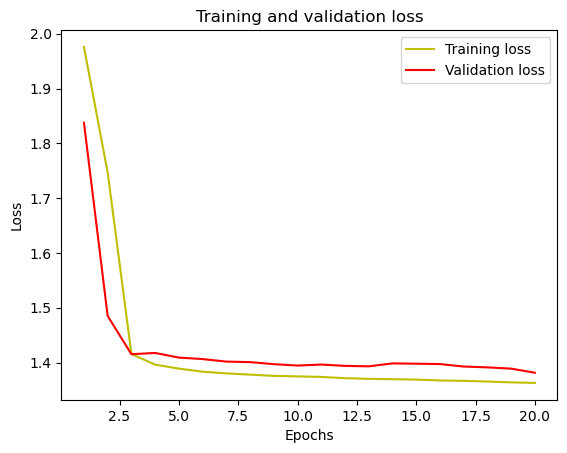

In [42]:
#plot the training and validation accuracy and loss at each epoch
loss = history.history['loss']
val_loss = history.history['val_loss']
epochs = range(1, len(loss) + 1)
plt.plot(epochs, loss, 'y', label='Training loss')
plt.plot(epochs, val_loss, 'r', label='Validation loss')
plt.title('Training and validation loss')
plt.xlabel('Epochs')
plt.ylabel('Loss')
plt.legend()
plt.show()

In [49]:
acc = history.history['accuracy']
val_acc = history.history['val_accuracy']

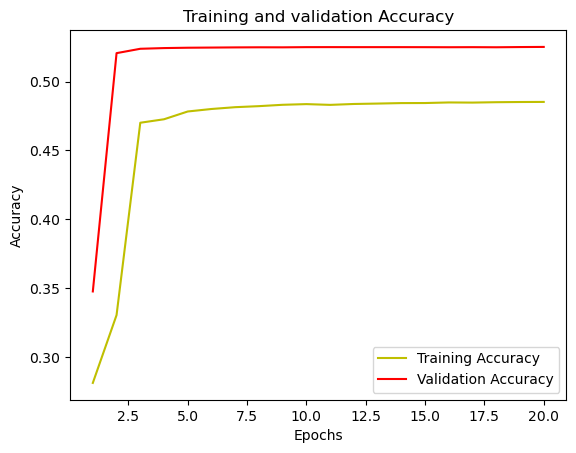

In [50]:
plt.plot(epochs, acc, 'y', label='Training Accuracy')
plt.plot(epochs, val_acc, 'r', label='Validation Accuracy')
plt.title('Training and validation Accuracy')
plt.xlabel('Epochs')
plt.ylabel('Accuracy')
plt.legend()
plt.show()

In [52]:
#model = get_model()
model.load_weights('test.hdf5')  
#model.load_weights('sandstone_50_epochs_catXentropy_acc_with_weights.hdf5')  

In [53]:
#IOU
y_pred=model.predict(X_test)
y_pred_argmax=np.argmax(y_pred, axis=3)

2/2 [==============================] - 1s 240ms/step


In [54]:
#Using built in keras function
from keras.metrics import MeanIoU
n_classes = 10
IOU_keras = MeanIoU(num_classes=n_classes)  
IOU_keras.update_state(y_test[:,:,:,0], y_pred_argmax)
print("Mean IoU =", IOU_keras.result().numpy())

Mean IoU = 0.13436963


In [55]:
#To calculate I0U for each class...
values = np.array(IOU_keras.get_weights()).reshape(n_classes, n_classes)
print(values)
class1_IoU = values[0,0]/(values[0,0] + values[0,1] + values[0,2] + values[0,3] + values[1,0]+ values[2,0]+ values[3,0])
class2_IoU = values[1,1]/(values[1,1] + values[1,0] + values[1,2] + values[1,3] + values[0,1]+ values[2,1]+ values[3,1])
class3_IoU = values[2,2]/(values[2,2] + values[2,0] + values[2,1] + values[2,3] + values[0,2]+ values[1,2]+ values[3,2])
class4_IoU = values[3,3]/(values[3,3] + values[3,0] + values[3,1] + values[3,2] + values[0,3]+ values[1,3]+ values[2,3])

[[8.85592e+05 0.00000e+00 0.00000e+00 0.00000e+00 2.03000e+03 0.00000e+00
  0.00000e+00 0.00000e+00 0.00000e+00 3.71600e+03]
 [1.29890e+04 0.00000e+00 0.00000e+00 0.00000e+00 3.10000e+01 0.00000e+00
  0.00000e+00 0.00000e+00 0.00000e+00 7.00000e+01]
 [6.99850e+04 0.00000e+00 0.00000e+00 0.00000e+00 7.40000e+01 0.00000e+00
  0.00000e+00 0.00000e+00 0.00000e+00 3.58000e+02]
 [1.44268e+05 0.00000e+00 0.00000e+00 0.00000e+00 6.30000e+01 0.00000e+00
  0.00000e+00 0.00000e+00 0.00000e+00 5.26000e+02]
 [3.87550e+04 0.00000e+00 0.00000e+00 1.00000e+00 4.54963e+05 0.00000e+00
  0.00000e+00 0.00000e+00 0.00000e+00 2.32000e+02]
 [4.09330e+05 0.00000e+00 0.00000e+00 0.00000e+00 4.60000e+01 0.00000e+00
  0.00000e+00 0.00000e+00 0.00000e+00 1.81000e+03]
 [6.70720e+04 0.00000e+00 0.00000e+00 0.00000e+00 4.70000e+01 0.00000e+00
  0.00000e+00 0.00000e+00 0.00000e+00 6.46000e+02]
 [1.86250e+04 0.00000e+00 0.00000e+00 0.00000e+00 1.30000e+01 0.00000e+00
  0.00000e+00 0.00000e+00 0.00000e+00 8.10000e+01]


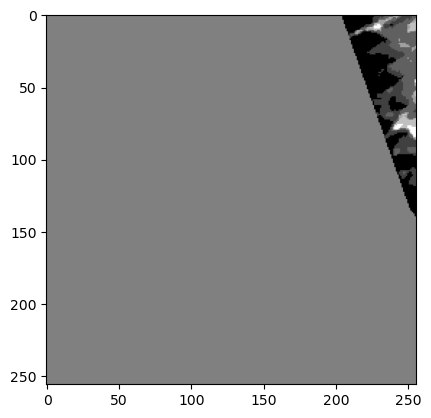

In [57]:
plt.imshow(train_images[0, :,:,0], cmap='gray')
plt.imshow(train_masks[0], cmap='gray')

In [276]:
#Predict on a few images
#model = get_model()
#model.load_weights('???.hdf5')  
import random
test_img_number = random.randint(0, len(X_test5))
test_img = X_test5[test_img_number]
ground_truth=y_test_cat[test_img_number]
test_img_norm=test_img[:,:,0][:,:,None]
test_img_input=np.expand_dims(test_img_norm, 0)
prediction = (model.predict(test_img_input))
predicted_img=np.argmax(prediction, axis=3)[0,:,:]



plt.figure(figsize=(12, 8))
plt.subplot(231)
plt.title('Testing Image')
plt.imshow(test_img[:,:,0], cmap='gray')
plt.subplot(232)
plt.title('Testing Label')
plt.imshow(ground_truth[:,:,0], cmap='jet')
plt.subplot(233)
plt.title('Prediction on test image')
plt.imshow(predicted_img, cmap='jet')
plt.show()

IndexError: index 90 is out of bounds for axis 0 with size 90

In [186]:
#Apply a trained model on large image

from patchify import patchify, unpatchify

In [222]:
large_images = 'C:/Users/mrg22-020914479/Downloads/sentinel_1722.tif'

In [234]:
with rasterio.open(large_images) as src:
    # Read the image data as a numpy array
    large_image = src.read(1) 
    large_image = np.nan_to_num(large_image, nan=0)

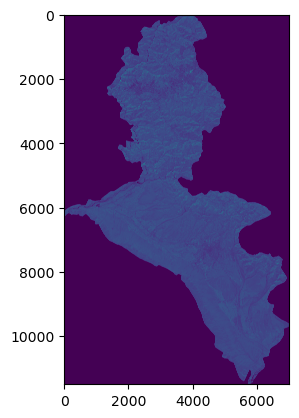

In [206]:
plt.imshow(large_image[0, :, :])

In [235]:
print(large_image.shape)

(11499, 7005)


In [248]:
patch_size = (256, 256)
step_size = (256)

In [249]:
patches = patchify(large_image, patch_size, step_size)
  #Step=256 for 256 patches means no overlap

In [250]:
predicted_patches = []
for i in range(patches.shape[0]):
    for j in range(patches.shape[1]):
        print(i,j)
        
        single_patch = patches[i,j,:,:]       
        single_patch_norm = np.expand_dims(normalize(np.array(single_patch), axis=1),2)
        single_patch_input=np.expand_dims(single_patch_norm, 0)
        single_patch_prediction = (model.predict(single_patch_input))
        single_patch_predicted_img=np.argmax(single_patch_prediction, axis=3)[0,:,:]

        predicted_patches.append(single_patch_predicted_img)

0 0
1/1 [==============================] - 0s 246ms/step
0 1
1/1 [==============================] - 0s 171ms/step
0 2
1/1 [==============================] - 0s 168ms/step
0 3
1/1 [==============================] - 0s 167ms/step
0 4
1/1 [==============================] - 0s 165ms/step
0 5
1/1 [==============================] - 0s 182ms/step
0 6
1/1 [==============================] - 0s 184ms/step
0 7
1/1 [==============================] - 0s 185ms/step
0 8
1/1 [==============================] - 0s 340ms/step
0 9
1/1 [==============================] - 0s 182ms/step
0 10
1/1 [==============================] - 0s 165ms/step
0 11
1/1 [==============================] - 0s 178ms/step
0 12
1/1 [==============================] - 0s 158ms/step
0 13
1/1 [==============================] - 0s 218ms/step
0 14
1/1 [==============================] - 0s 172ms/step
0 15
1/1 [==============================] - 0s 160ms/step
0 16
1/1 [==============================] - 0s 165ms/step
0 17
1/1 [==============

In [251]:
predicted_patches = np.array(predicted_patches)

In [252]:
predicted_patches_reshaped = np.reshape(predicted_patches, (patches.shape[0], patches.shape[1], 256,256) )

In [256]:
import numpy as np

# Original image dimensions
image_height = 7005
image_width = 11499

# Find the largest patch size that evenly divides both dimensions
patch_height = 1
patch_width = 1

for i in range(256, 0, -1):
    if image_height % i == 0 and image_width % i == 0:
        patch_height = i
        patch_width = i
        break

# Choose a step size that evenly divides the patch size
step_size = patch_height

# Calculate the number of patches in each dimension
num_patches_vertical = image_height // patch_height
num_patches_horizontal = image_width // patch_width

# Print the results
print("Patch Size (height x width):", (patch_height, patch_width))
print("Step Size:", step_size)
print("Number of Patches (vertical x horizontal):", (num_patches_vertical, num_patches_horizontal))


Patch Size (height x width): (3, 3)
Step Size: 3
Number of Patches (vertical x horizontal): (2335, 3833)


In [31]:
#MODIFIED MODEL _ MULTI INPUT MULTI CLASS UNET MODEL

In [96]:
################################################################
def multi_input_multiclass_unet_model(n_classes=6, IMG_HEIGHT=64, IMG_WIDTH=64, IMG_CHANNELS=1):
#Build the model
    inputs_bands = Input((IMG_HEIGHT, IMG_WIDTH, IMG_CHANNELS))
    inputs_indices = Input((IMG_HEIGHT, IMG_WIDTH, IMG_CHANNELS))
    
    #s = Lambda(lambda x: x / 255)(inputs)   #No need for this if we normalize our inputs beforehand
    s1 = inputs_bands
    s2= inputs_indices

    #Contraction path bands
    c1_bands = Conv2D(16, (3, 3), activation='relu', kernel_initializer='he_normal', padding='same')(s1)
    c1_bands = Dropout(0.1)(c1_bands)
    c1_bands = Conv2D(16, (3, 3), activation='relu', kernel_initializer='he_normal', padding='same')(c1_bands)
    p1_bands = MaxPooling2D((2, 2))(c1_bands)
    
    c2_bands = Conv2D(32, (3, 3), activation='relu', kernel_initializer='he_normal', padding='same')(p1_bands)
    c2_bands = Dropout(0.1)(c2_bands)
    c2_bands = Conv2D(32, (3, 3), activation='relu', kernel_initializer='he_normal', padding='same')(c2_bands)
    p2_bands = MaxPooling2D((2, 2))(c2_bands)
     
    c3_bands = Conv2D(64, (3, 3), activation='relu', kernel_initializer='he_normal', padding='same')(p2_bands)
    c3_bands = Dropout(0.2)(c3_bands)
    c3_bands = Conv2D(64, (3, 3), activation='relu', kernel_initializer='he_normal', padding='same')(c3_bands)
    p3_bands = MaxPooling2D((2, 2))(c3_bands)
     
    c4_bands = Conv2D(128, (3, 3), activation='relu', kernel_initializer='he_normal', padding='same')(p3_bands)
    c4_bands = Dropout(0.2)(c4_bands)
    c4_bands = Conv2D(128, (3, 3), activation='relu', kernel_initializer='he_normal', padding='same')(c4_bands)
    p4_bands = MaxPooling2D(pool_size=(2, 2))(c4_bands)
     
    c5_bands = Conv2D(256, (3, 3), activation='relu', kernel_initializer='he_normal', padding='same')(p4_bands)
    c5_bands = Dropout(0.3)(c5_bands)
    c5_bands = Conv2D(256, (3, 3), activation='relu', kernel_initializer='he_normal', padding='same')(c5_bands)
    
    
    
    
    
    
    
    #Contraction path indices  ndvi  
    c1_indices = Conv2D(16, (3, 3), activation='relu', kernel_initializer='he_normal', padding='same')(s2)
    c1_indices = Dropout(0.1)(c1_indices)
    c1_indices = Conv2D(16, (3, 3), activation='relu', kernel_initializer='he_normal', padding='same')(c1_indices)
    p1_indices = MaxPooling2D((2, 2))(c1_indices)
    
    c2_indices = Conv2D(32, (3, 3), activation='relu', kernel_initializer='he_normal', padding='same')(p1_indices)
    c2_indices = Dropout(0.1)(c2_indices)
    c2_indices = Conv2D(32, (3, 3), activation='relu', kernel_initializer='he_normal', padding='same')(c2_indices)
    p2_indices = MaxPooling2D((2, 2))(c2_indices)
     
    c3_indices = Conv2D(64, (3, 3), activation='relu', kernel_initializer='he_normal', padding='same')(p2_indices)
    c3_indices = Dropout(0.2)(c3_indices)
    c3_indices = Conv2D(64, (3, 3), activation='relu', kernel_initializer='he_normal', padding='same')(c3_indices)
    p3_indices = MaxPooling2D((2, 2))(c3_indices)
     
    c4_indices = Conv2D(128, (3, 3), activation='relu', kernel_initializer='he_normal', padding='same')(p3_indices)
    c4_indices = Dropout(0.2)(c4_indices)
    c4_indices = Conv2D(128, (3, 3), activation='relu', kernel_initializer='he_normal', padding='same')(c4_indices)
    p4_indices = MaxPooling2D(pool_size=(2, 2))(c4_indices)
     
    c5_indices = Conv2D(256, (3, 3), activation='relu', kernel_initializer='he_normal', padding='same')(p4_indices)
    c5_indices = Dropout(0.3)(c5_indices)
    c5_indices = Conv2D(256, (3, 3), activation='relu', kernel_initializer='he_normal', padding='same')(c5_indices)    
    
    
    
    
    merged = concatenate([c5_bands, c5_indices])  # Add more data sources as needed    
    
    
    
    #Expansive path 
    u6_bands = Conv2DTranspose(128, (2, 2), strides=(2, 2), padding='same')(merged)
    u6_bands = concatenate([u6_bands, c4_bands,c4_indices])
    c6_bands = Conv2D(128, (3, 3), activation='relu', kernel_initializer='he_normal', padding='same')(u6_bands)
    c6_bands = Dropout(0.2)(c6_bands)
    c6_bands = Conv2D(128, (3, 3), activation='relu', kernel_initializer='he_normal', padding='same')(c6_bands)
     
    u7_bands = Conv2DTranspose(64, (2, 2), strides=(2, 2), padding='same')(c6_bands)
    u7_bands = concatenate([u7_bands, c3_bands,c3_indices])
    c7_bands = Conv2D(64, (3, 3), activation='relu', kernel_initializer='he_normal', padding='same')(u7_bands)
    c7_bands = Dropout(0.2)(c7_bands)
    c7_bands = Conv2D(64, (3, 3), activation='relu', kernel_initializer='he_normal', padding='same')(c7_bands)
     
    u8_bands = Conv2DTranspose(32, (2, 2), strides=(2, 2), padding='same')(c7_bands)
    u8_bands = concatenate([u8_bands, c2_bands,c2_indices])
    c8_bands = Conv2D(32, (3, 3), activation='relu', kernel_initializer='he_normal', padding='same')(u8_bands)
    c8_bands = Dropout(0.1)(c8_bands)
    c8_bands = Conv2D(32, (3, 3), activation='relu', kernel_initializer='he_normal', padding='same')(c8_bands)
     
    u9_bands = Conv2DTranspose(16, (2, 2), strides=(2, 2), padding='same')(c8_bands)
    u9_bands = concatenate([u9_bands, c1_bands,c1_indices], axis=3)
    c9_bands = Conv2D(16, (3, 3), activation='relu', kernel_initializer='he_normal', padding='same')(u9_bands)
    c9_bands = Dropout(0.1)(c9_bands)
    c9_bands = Conv2D(16, (3, 3), activation='relu', kernel_initializer='he_normal', padding='same')(c9_bands)
     
    outputs = Conv2D(n_classes, (1, 1), activation='softmax')(c9_bands)
     
    model = Model(inputs=[inputs_bands,inputs_indices], outputs=[outputs])
    
    #NOTE: Compile the model in the main program to make it easy to test with various loss functions
    #model.compile(optimizer='adam', loss='binary_crossentropy', metrics=['accuracy'])
    
    #model.summary()
    
    return model
 

In [97]:
def get_model():
    return multi_input_multiclass_unet_model(n_classes=6, IMG_HEIGHT=64, IMG_WIDTH=64, IMG_CHANNELS=1)

In [98]:
model = get_model()

In [99]:
model.compile(optimizer='adam', loss='categorical_crossentropy', metrics=['accuracy'])

In [100]:
model.summary()

Model: "model_2"
__________________________________________________________________________________________________
 Layer (type)                Output Shape                 Param #   Connected to                  
 input_16 (InputLayer)       [(None, 64, 64, 1)]          0         []                            
                                                                                                  
 input_17 (InputLayer)       [(None, 64, 64, 1)]          0         []                            
                                                                                                  
 conv2d_168 (Conv2D)         (None, 64, 64, 16)           160       ['input_16[0][0]']            
                                                                                                  
 conv2d_178 (Conv2D)         (None, 64, 64, 16)           160       ['input_17[0][0]']            
                                                                                            

In [101]:
history = model.fit([X1,X2], y_train_cat, 
                    batch_size = 8, 
                    verbose=1, 
                    epochs=20, 
                    validation_data=([X_test1,X_test2], y_test_cat), 
                    #class_weight=class_weights,
                    shuffle=False)

Epoch 1/20
102/102 [==============================] - 31s 268ms/step - loss: 1.4021 - accuracy: 0.4907 - val_loss: 1.0328 - val_accuracy: 0.6082
Epoch 2/20
102/102 [==============================] - 27s 265ms/step - loss: 0.9217 - accuracy: 0.6678 - val_loss: 0.8746 - val_accuracy: 0.6549
Epoch 3/20
102/102 [==============================] - 28s 276ms/step - loss: 0.8143 - accuracy: 0.6926 - val_loss: 0.8102 - val_accuracy: 0.6817
Epoch 4/20
102/102 [==============================] - 27s 268ms/step - loss: 0.8001 - accuracy: 0.6947 - val_loss: 0.7927 - val_accuracy: 0.6792
Epoch 5/20
102/102 [==============================] - 27s 267ms/step - loss: 0.7608 - accuracy: 0.7086 - val_loss: 0.7715 - val_accuracy: 0.6896
Epoch 6/20
102/102 [==============================] - 27s 269ms/step - loss: 0.7542 - accuracy: 0.7098 - val_loss: 0.8030 - val_accuracy: 0.6811
Epoch 7/20
102/102 [==============================] - 28s 272ms/step - loss: 0.7454 - accuracy: 0.7134 - val_loss: 0.7745 - val_ac

In [104]:
model.save('testndvi.hdf5')

C:\Users\mrg22-020914479\.conda\envs\TestDL\Lib\site-packages\keras\src\engine\training.py:3000: UserWarning: You are saving your model as an HDF5 file via `model.save()`. This file format is considered legacy. We recommend using instead the native Keras format, e.g. `model.save('my_model.keras')`.
  saving_api.save_model(


In [105]:
#Evaluate the model
	# evaluate model
_, acc = model.evaluate([X_test1,X_test2], y_test_cat)
print("Accuracy is = ", (acc * 100.0), "%")

3/3 [==============================] - 0s 97ms/step - loss: 5.2259 - accuracy: 0.2757
Accuracy is =  27.571886777877808 %


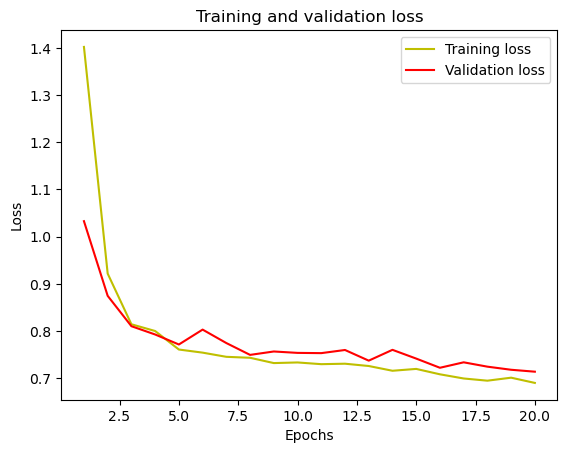

In [106]:
#plot the training and validation accuracy and loss at each epoch
loss = history.history['loss']
val_loss = history.history['val_loss']
epochs = range(1, len(loss) + 1)
plt.plot(epochs, loss, 'y', label='Training loss')
plt.plot(epochs, val_loss, 'r', label='Validation loss')
plt.title('Training and validation loss')
plt.xlabel('Epochs')
plt.ylabel('Loss')
plt.legend()
plt.show()

In [107]:
acc = history.history['accuracy']
val_acc = history.history['val_accuracy']

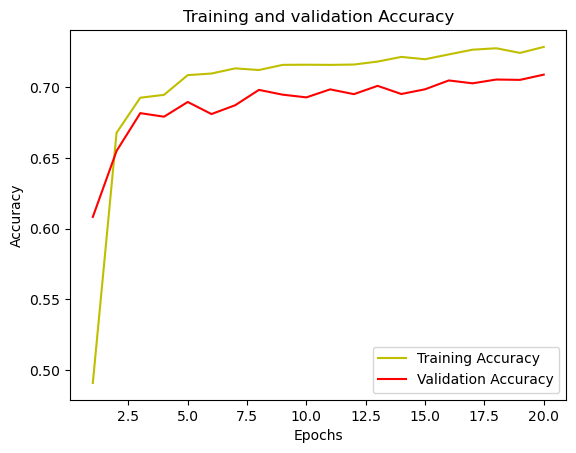

In [108]:
plt.plot(epochs, acc, 'y', label='Training Accuracy')
plt.plot(epochs, val_acc, 'r', label='Validation Accuracy')
plt.title('Training and validation Accuracy')
plt.xlabel('Epochs')
plt.ylabel('Accuracy')
plt.legend()
plt.show()

In [62]:
import tensorflow as tf
import torch
import rasterio
import numpy as np
from keras.utils import normalize
import os
import glob
import numpy as np
from matplotlib import pyplot as plt

In [63]:
model_path = 'C:/Users/mrg22-020914479/testndvi.hdf5'

In [64]:
model = tf.keras.models.load_model(model_path)

776
1/1 [==============================] - 0s 26ms/step


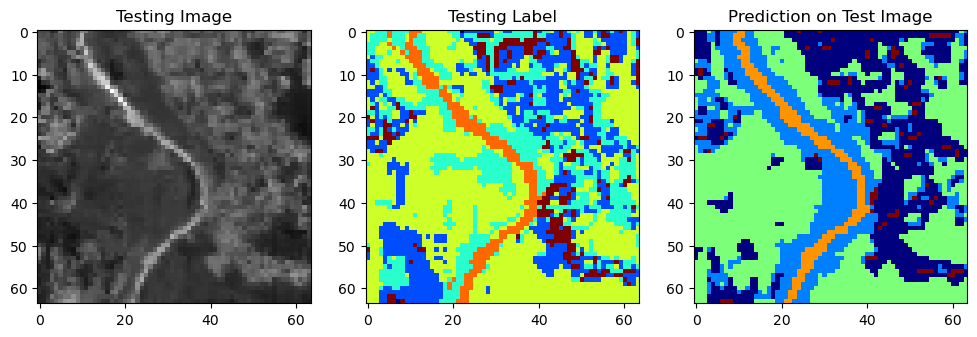

In [68]:
import random

# Generate two random test image numbers
test_img_number5 = random.randint(0, len(X5) - 1)
#test_img_number0 = random.randint(0, len(X6) - 1)

print(test_img_number5)
#print(test_img_number6)

test_img5 = X5[test_img_number5]
test_img6 = X6[test_img_number5]


ground_truth5 = y1[test_img_number5]
ground_truth6 = y1[test_img_number5]


# Preprocess the test images if necessary
test_img5_norm = test_img5[:, :, 0][:, :, None]
test_img6_norm = test_img6[:, :, 0][:, :, None]

# Expand dimensions for model input
test_img5_input = np.expand_dims(test_img5_norm, 0)
test_img6_input = np.expand_dims(test_img6_norm, 0)

# Make predictions using both inputs
prediction5 = model.predict([test_img5_input, test_img6_input])
predicted_img5 = np.argmax(prediction5, axis=3)[0, :, :]

# Display the first testing image and its prediction
plt.figure(figsize=(12, 8))
plt.subplot(231)
plt.title('Testing Image')
plt.imshow(test_img6[:, :, 0], cmap='gray')
plt.subplot(232)
plt.title('Testing Label')
plt.imshow(ground_truth5[:, :, 0], cmap='jet')
plt.subplot(233)
plt.title('Prediction on Test Image')
plt.imshow(predicted_img5, cmap='jet')



In [66]:
print(X5.shape)

(810, 64, 64, 1)


In [67]:
print(ground_truth5.shape)

(64, 64, 1)


In [71]:
import numpy as np
from sklearn.metrics import accuracy_score, precision_score, recall_score, f1_score, confusion_matrix


# Make predictions on the test data
y_pred = model.predict([X_test1, X_test2])

3/3 [==============================] - 0s 93ms/step


In [72]:


# Convert predictions and ground truth labels to binary format (0 or 1) using a threshold
threshold = 0.5  # Adjust this threshold based on your model and problem
y_pred_binary = (y_pred > threshold).astype(int)
y_true_binary = y_test_cat.astype(int)

# Calculate evaluation metrics
precision = precision_score(y_true_binary.flatten(), y_pred_binary.flatten())
recall = recall_score(y_true_binary.flatten(), y_pred_binary.flatten())
accuracy = accuracy_score(y_true_binary.flatten(), y_pred_binary.flatten())
f1 = f1_score(y_true_binary.flatten(), y_pred_binary.flatten())

# Confusion matrix for IoU calculation
conf_matrix = confusion_matrix(y_true_binary.flatten(), y_pred_binary.flatten())
true_positive = conf_matrix[1, 1]
false_positive = conf_matrix[0, 1]
false_negative = conf_matrix[1, 0]

iou = true_positive / (true_positive + false_positive + false_negative)

# Print or use the metrics as needed
print(f'Precision: {precision}')
print(f'Recall: {recall}')
print(f'Accuracy: {accuracy}')
print(f'F1 Score: {f1}')
print(f'IoU: {iou}')

Precision: 0.2729080839221892
Recall: 0.27134602864583335
Accuracy: 0.7580692997685186
F1 Score: 0.27212481466871613
IoU: 0.15749101380638314


In [60]:
#check for large images

In [62]:
import patchify
from patchify import patchify, unpatchify

In [82]:
large_image_1 = 'D:/Jintu/Jintu_ShareFolder/TestDL_2/Landsat Images/NDVI/Landsat_2019_01_NDVI.tif'
large_image_2 = 'D:/Jintu/Jintu_ShareFolder/TestDL_2/Landsat Images/NDWI/Landsat_2019_01_NDWI.tif'

In [120]:
with rasterio.open(large_image_1) as src:
    # Read the image data as a numpy array
    large_image1 = src.read(1) 
    large_image1 = np.nan_to_num(large_image1, nan=0)
    
with rasterio.open(large_image_2) as src:
    # Read the image data as a numpy array
    large_image2 = src.read(1) 
    large_image2 = np.nan_to_num(large_image2, nan=0)

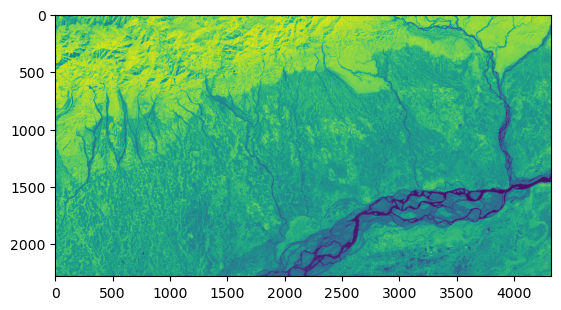

In [86]:
plt.imshow(large_image1)

In [87]:
patch_size = (256, 256)
step_size = (256)

In [101]:
patches_1 = patchify(large_image1, patch_size, step_size)
patches_2 = patchify(large_image2, patch_size, step_size)
  #Step=256 for 256 patches means no overlap

In [111]:
import numpy as np
from patchify import patchify
import rasterio

# Load your two large images using rasterio
large_image_1_path = 'D:/Jintu/Jintu_ShareFolder/TestDL_2/Landsat Images/NDVI/Landsat_2019_01_NDVI.tif'
large_image_2_path = 'D:/Jintu/Jintu_ShareFolder/TestDL_2/Landsat Images/NDWI/Landsat_2019_01_NDWI.tif'

In [155]:
# Open the images using rasterio
with rasterio.open(large_image_1_path) as dataset_1, rasterio.open(large_image_2_path) as dataset_2:
    # Read image data as numpy arrays
    large_image_1 = dataset_1.read(1) 
    large_image_2 = dataset_2.read(1) 

    # Crop both images to a size that is divisible by 256x256
    patch_size = (256, 256)
    SIZE_X = (large_image_1.shape[1] // patch_size[1]) * patch_size[1]
    SIZE_Y = (large_image_1.shape[0] // patch_size[0]) * patch_size[0]

    large_image_1_cropped = large_image_1[:SIZE_Y, :SIZE_X]
    large_image_2_cropped = large_image_2[:SIZE_Y, :SIZE_X]

In [156]:
# Now, you can proceed with patchification as before
# Assuming you have defined 'patch_size' and 'step_size'
step_size = 256  # Adjust this as needed

In [157]:
# Patchify the cropped images
patches_1 = patchify(large_image_1_cropped, patch_size, step_size)
patches_2 = patchify(large_image_2_cropped, patch_size, step_size)

In [158]:
# Initialize an empty list to store the predicted patches
predicted_patches = []

In [159]:
# Loop through the patches and make predictions
for i in range(patches_1.shape[0]):
    for j in range(patches_1.shape[1]):
        print(i, j)

        # Extract individual patches from both images
        patch_1 = patches_1[i, j, :, :]
        patch_2 = patches_2[i, j, :, :]

        # Normalize and prepare the patches for prediction
        patch_1_norm = np.expand_dims(normalize(np.array(patch_1), axis=1), 2)
        patch_2_norm = np.expand_dims(normalize(np.array(patch_2), axis=1), 2)

        # Expand dimensions and prepare the input for the model
        patch_input = [np.expand_dims(patch_1_norm, 0), np.expand_dims(patch_2_norm, 0)]

        # Make predictions using your model
        patch_prediction = model.predict(patch_input)

        # Extract the predicted image
        patch_predicted_img = np.argmax(patch_prediction, axis=3)[0, :, :]

        # Append the predicted patch to the list
        predicted_patches.append(patch_predicted_img)

0 0
1/1 [==============================] - 0s 66ms/step
0 1
1/1 [==============================] - 0s 81ms/step
0 2
1/1 [==============================] - 0s 74ms/step
0 3
1/1 [==============================] - 0s 70ms/step
0 4
1/1 [==============================] - 0s 75ms/step
0 5
1/1 [==============================] - 0s 85ms/step
0 6
1/1 [==============================] - 0s 72ms/step
0 7
1/1 [==============================] - 0s 71ms/step
0 8
1/1 [==============================] - 0s 79ms/step
0 9
1/1 [==============================] - 0s 62ms/step
0 10
1/1 [==============================] - 0s 77ms/step
0 11
1/1 [==============================] - 0s 148ms/step
0 12
1/1 [==============================] - 0s 83ms/step
0 13
1/1 [==============================] - 0s 84ms/step
0 14
1/1 [==============================] - 0s 87ms/step
0 15
1/1 [==============================] - 0s 87ms/step
1 0
1/1 [==============================] - 0s 105ms/step
1 1
1/1 [==============================]

In [160]:
# Convert the list of predicted patches to a NumPy array
predicted_patches = np.array(predicted_patches)

In [161]:
# Reshape the predicted patches to match the original shape
predicted_patches_reshaped = np.reshape(predicted_patches, (patches_1.shape[0], patches_1.shape[1], 256, 256))

In [162]:
# Convert the list of predicted patches to a NumPy array
predicted_patches = np.array(predicted_patches)

In [163]:
# Reshape the predicted patches to match the original shape
predicted_patches_reshaped = np.reshape(predicted_patches, (patches_1.shape[0], patches_1.shape[1], 256, 256))

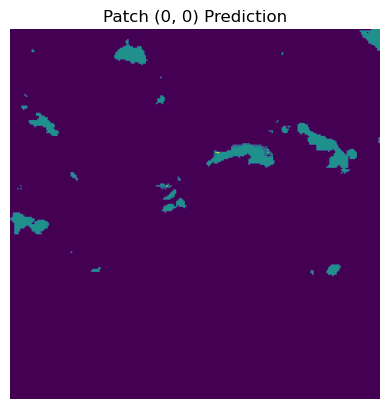

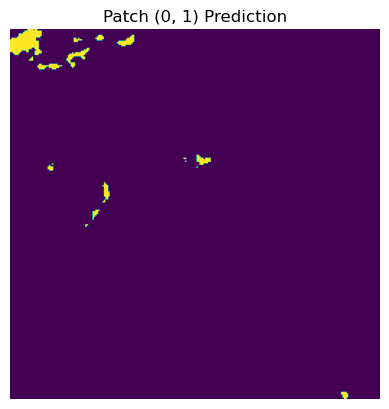

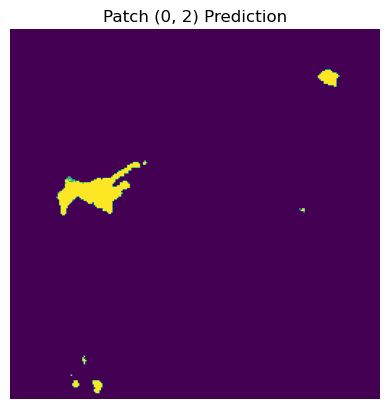

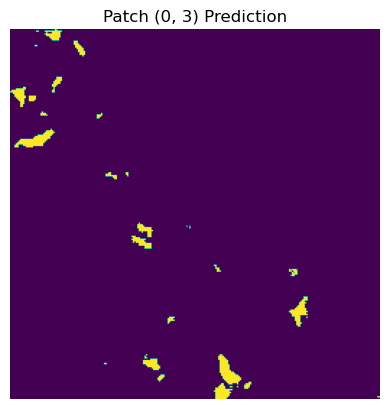

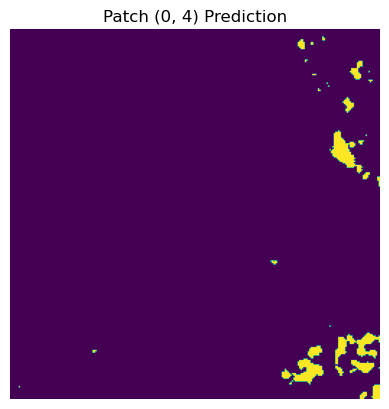

...

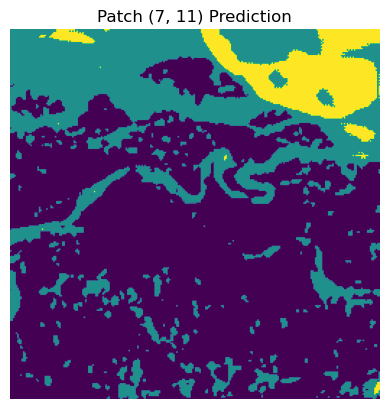

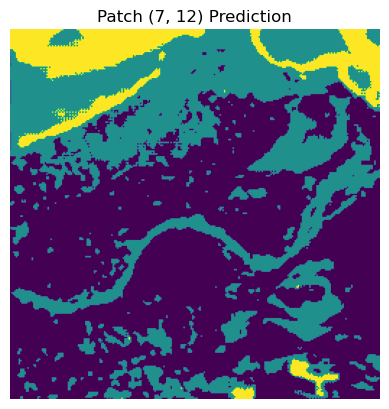

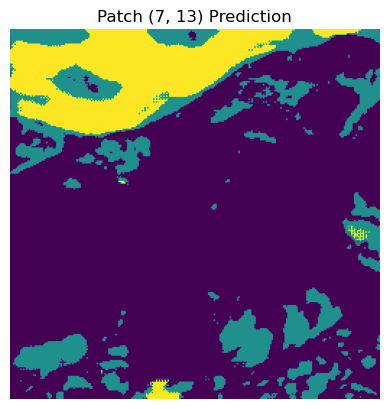

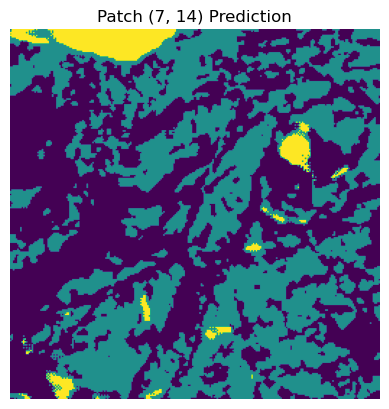

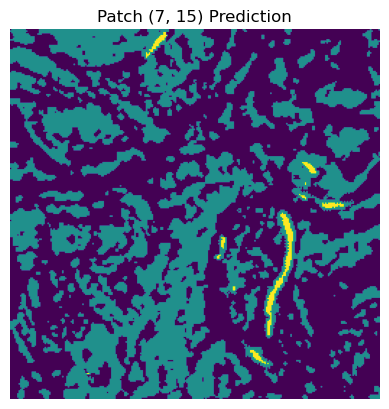

In [164]:

# Loop through the reshaped predicted patches and plot them
for i in range(predicted_patches_reshaped.shape[0]):
    for j in range(predicted_patches_reshaped.shape[1]):
        plt.figure()
        plt.imshow(predicted_patches_reshaped[i, j], cmap='viridis')  # Assuming grayscale images
        plt.title(f'Patch ({i}, {j}) Prediction')
        plt.axis('off')
        plt.show()

In [198]:
 reconstructed_image = unpatchify(predicted_patches_reshaped, large_image_1_cropped.shape)

In [199]:
print(reconstructed_image.shape)

(2048, 4096)


In [200]:
print(reconstructed_image)

[[1 1 1 ... 1 1 1]
 [1 1 1 ... 1 1 1]
 [1 1 1 ... 1 1 1]
 ...
 [4 1 4 ... 4 4 4]
 [4 4 4 ... 4 4 4]
 [4 4 4 ... 4 4 4]]


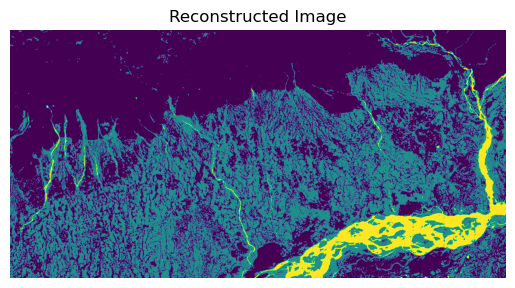

In [201]:
# Show the reconstructed image
plt.imshow(reconstructed_image, cmap='viridis')  # Assuming grayscale
plt.title('Reconstructed Image')
plt.axis('off')
plt.show()

In [203]:
import os
import rasterio

# Define the output file path for the reconstructed image
reconstructed_output_path = os.path.join(root_directory, 'reconstructed_image.tif')

try:
    # Create a new TIFF file using Rasterio
    with rasterio.open(
        reconstructed_output_path,
        'w',
        driver='GTiff',
        height=reconstructed_image.shape[0],
        width=reconstructed_image.shape[1],
        count=1,  # Assuming it's a single-band image
        dtype=reconstructed_image.dtype
    ) as dst:
        dst.write(reconstructed_image, 1)  # Write the reconstructed_image to the GeoTIFF

    print(f"Saved the reconstructed image as {reconstructed_output_path}")

except Exception as e:
    print(f"Failed to save the reconstructed image: {e}")


Saved the reconstructed image as D:/Jintu/Jintu_ShareFolder/TestDL_2/Predicted images/Test/reconstructed_image.tif


In [204]:
print("Class values in the dataset are ... ", np.unique( reconstructed_image))

Class values in the dataset are ...  [1 3 4 6 7]


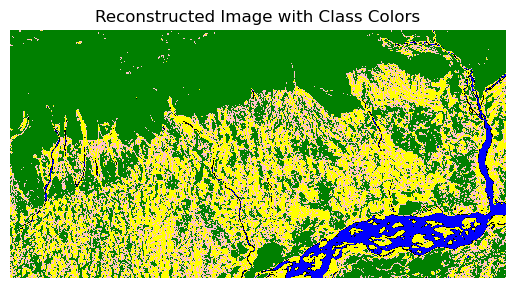

In [209]:
import matplotlib.colors as mcolors

# Define a colormap with specific colors for each class
# You can choose preferable colors for each class
class_colors = {
    1: 'green',    # Class 1: Green
    7: 'blue',     # Class 7: Blue
    4: 'yellow',   # Class 4: Yellow
    6: 'black',    # Class 6: Gray
    3: 'pink'      # Class 3: Grassland 
}

# Create a colormap with specific colors
cmap = mcolors.ListedColormap([class_colors[i] for i in sorted(class_colors.keys())])

# Plot the reconstructed image using the colormap
plt.imshow(reconstructed_image, cmap=cmap, vmin=1, vmax=7)  # Adjust vmin and vmax for your classes
plt.title('Reconstructed Image with Class Colors')
plt.axis('off')
plt.show()

In [64]:
#ndvi evi bands

In [65]:
################################################################
def multi_input_multiclass_unet_model2(n_classes=6, IMG_HEIGHT=128, IMG_WIDTH=128, IMG_CHANNELS=1):
#Build the model
    inputs_bands = Input((IMG_HEIGHT, IMG_WIDTH, IMG_CHANNELS))
    inputs_indices = Input((IMG_HEIGHT, IMG_WIDTH, IMG_CHANNELS))
    inputs_evi = Input((IMG_HEIGHT, IMG_WIDTH, IMG_CHANNELS))
    #s = Lambda(lambda x: x / 255)(inputs)   #No need for this if we normalize our inputs beforehand
    s1 = inputs_bands
    s2= inputs_indices
    s3= inputs_evi
    

    #Contraction path bands
    c1_bands = Conv2D(16, (3, 3), activation='relu', kernel_initializer='he_normal', padding='same')(s1)
    c1_bands = Dropout(0.1)(c1_bands)
    c1_bands = Conv2D(16, (3, 3), activation='relu', kernel_initializer='he_normal', padding='same')(c1_bands)
    p1_bands = MaxPooling2D((2, 2))(c1_bands)
    
    c2_bands = Conv2D(32, (3, 3), activation='relu', kernel_initializer='he_normal', padding='same')(p1_bands)
    c2_bands = Dropout(0.1)(c2_bands)
    c2_bands = Conv2D(32, (3, 3), activation='relu', kernel_initializer='he_normal', padding='same')(c2_bands)
    p2_bands = MaxPooling2D((2, 2))(c2_bands)
     
    c3_bands = Conv2D(64, (3, 3), activation='relu', kernel_initializer='he_normal', padding='same')(p2_bands)
    c3_bands = Dropout(0.2)(c3_bands)
    c3_bands = Conv2D(64, (3, 3), activation='relu', kernel_initializer='he_normal', padding='same')(c3_bands)
    p3_bands = MaxPooling2D((2, 2))(c3_bands)
     
    c4_bands = Conv2D(128, (3, 3), activation='relu', kernel_initializer='he_normal', padding='same')(p3_bands)
    c4_bands = Dropout(0.2)(c4_bands)
    c4_bands = Conv2D(128, (3, 3), activation='relu', kernel_initializer='he_normal', padding='same')(c4_bands)
    p4_bands = MaxPooling2D(pool_size=(2, 2))(c4_bands)
     
    c5_bands = Conv2D(256, (3, 3), activation='relu', kernel_initializer='he_normal', padding='same')(p4_bands)
    c5_bands = Dropout(0.3)(c5_bands)
    c5_bands = Conv2D(256, (3, 3), activation='relu', kernel_initializer='he_normal', padding='same')(c5_bands)
    
    
    
    
    
    
    
    #Contraction path indices  ndvi  
    c1_indices = Conv2D(16, (3, 3), activation='relu', kernel_initializer='he_normal', padding='same')(s2)
    c1_indices = Dropout(0.1)(c1_indices)
    c1_indices = Conv2D(16, (3, 3), activation='relu', kernel_initializer='he_normal', padding='same')(c1_indices)
    p1_indices = MaxPooling2D((2, 2))(c1_indices)
    
    c2_indices = Conv2D(32, (3, 3), activation='relu', kernel_initializer='he_normal', padding='same')(p1_indices)
    c2_indices = Dropout(0.1)(c2_indices)
    c2_indices = Conv2D(32, (3, 3), activation='relu', kernel_initializer='he_normal', padding='same')(c2_indices)
    p2_indices = MaxPooling2D((2, 2))(c2_indices)
     
    c3_indices = Conv2D(64, (3, 3), activation='relu', kernel_initializer='he_normal', padding='same')(p2_indices)
    c3_indices = Dropout(0.2)(c3_indices)
    c3_indices = Conv2D(64, (3, 3), activation='relu', kernel_initializer='he_normal', padding='same')(c3_indices)
    p3_indices = MaxPooling2D((2, 2))(c3_indices)
     
    c4_indices = Conv2D(128, (3, 3), activation='relu', kernel_initializer='he_normal', padding='same')(p3_indices)
    c4_indices = Dropout(0.2)(c4_indices)
    c4_indices = Conv2D(128, (3, 3), activation='relu', kernel_initializer='he_normal', padding='same')(c4_indices)
    p4_indices = MaxPooling2D(pool_size=(2, 2))(c4_indices)
     
    c5_indices = Conv2D(256, (3, 3), activation='relu', kernel_initializer='he_normal', padding='same')(p4_indices)
    c5_indices = Dropout(0.3)(c5_indices)
    c5_indices = Conv2D(256, (3, 3), activation='relu', kernel_initializer='he_normal', padding='same')(c5_indices)    
    

    
    #Contraction path indices    evi
    c1_evi = Conv2D(16, (3, 3), activation='relu', kernel_initializer='he_normal', padding='same')(s3)
    c1_evi = Dropout(0.1)(c1_evi)
    c1_evi = Conv2D(16, (3, 3), activation='relu', kernel_initializer='he_normal', padding='same')(c1_evi)
    p1_evi = MaxPooling2D((2, 2))(c1_evi)
    
    c2_evi = Conv2D(32, (3, 3), activation='relu', kernel_initializer='he_normal', padding='same')(p1_evi)
    c2_evi = Dropout(0.1)(c2_evi)
    c2_evi = Conv2D(32, (3, 3), activation='relu', kernel_initializer='he_normal', padding='same')(c2_evi)
    p2_evi = MaxPooling2D((2, 2))(c2_evi)
     
    c3_evi = Conv2D(64, (3, 3), activation='relu', kernel_initializer='he_normal', padding='same')(p2_evi)
    c3_evi = Dropout(0.2)(c3_evi)
    c3_evi = Conv2D(64, (3, 3), activation='relu', kernel_initializer='he_normal', padding='same')(c3_evi)
    p3_evi = MaxPooling2D((2, 2))(c3_evi)
     
    c4_evi = Conv2D(128, (3, 3), activation='relu', kernel_initializer='he_normal', padding='same')(p3_evi)
    c4_evi = Dropout(0.2)(c4_evi)
    c4_evi = Conv2D(128, (3, 3), activation='relu', kernel_initializer='he_normal', padding='same')(c4_evi)
    p4_evi = MaxPooling2D(pool_size=(2, 2))(c4_evi)
     
    c5_evi = Conv2D(256, (3, 3), activation='relu', kernel_initializer='he_normal', padding='same')(p4_evi)
    c5_evi = Dropout(0.3)(c5_evi)
    c5_evi = Conv2D(256, (3, 3), activation='relu', kernel_initializer='he_normal', padding='same')(c5_evi) 
    
    
    
    merged = concatenate([c5_bands, c5_indices,c5_evi])  # Add more data sources as needed    
    
    
    
    #Expansive path 
    u6_bands = Conv2DTranspose(128, (2, 2), strides=(2, 2), padding='same')(merged)
    u6_bands = concatenate([u6_bands, c4_bands,c4_indices,c4_evi])
    c6_bands = Conv2D(128, (3, 3), activation='relu', kernel_initializer='he_normal', padding='same')(u6_bands)
    c6_bands = Dropout(0.2)(c6_bands)
    c6_bands = Conv2D(128, (3, 3), activation='relu', kernel_initializer='he_normal', padding='same')(c6_bands)
     
    u7_bands = Conv2DTranspose(64, (2, 2), strides=(2, 2), padding='same')(c6_bands)
    u7_bands = concatenate([u7_bands, c3_bands,c3_indices,c3_evi])
    c7_bands = Conv2D(64, (3, 3), activation='relu', kernel_initializer='he_normal', padding='same')(u7_bands)
    c7_bands = Dropout(0.2)(c7_bands)
    c7_bands = Conv2D(64, (3, 3), activation='relu', kernel_initializer='he_normal', padding='same')(c7_bands)
     
    u8_bands = Conv2DTranspose(32, (2, 2), strides=(2, 2), padding='same')(c7_bands)
    u8_bands = concatenate([u8_bands, c2_bands,c2_indices,c2_evi])
    c8_bands = Conv2D(32, (3, 3), activation='relu', kernel_initializer='he_normal', padding='same')(u8_bands)
    c8_bands = Dropout(0.1)(c8_bands)
    c8_bands = Conv2D(32, (3, 3), activation='relu', kernel_initializer='he_normal', padding='same')(c8_bands)
     
    u9_bands = Conv2DTranspose(16, (2, 2), strides=(2, 2), padding='same')(c8_bands)
    u9_bands = concatenate([u9_bands, c1_bands,c1_indices,c1_evi], axis=3)
    c9_bands = Conv2D(16, (3, 3), activation='relu', kernel_initializer='he_normal', padding='same')(u9_bands)
    c9_bands = Dropout(0.1)(c9_bands)
    c9_bands = Conv2D(16, (3, 3), activation='relu', kernel_initializer='he_normal', padding='same')(c9_bands)
     
    outputs = Conv2D(n_classes, (1, 1), activation='softmax')(c9_bands)
     
    model = Model(inputs=[inputs_bands,inputs_indices,inputs_evi], outputs=[outputs])
    
    #NOTE: Compile the model in the main program to make it easy to test with various loss functions
    #model.compile(optimizer='adam', loss='binary_crossentropy', metrics=['accuracy'])
    
    #model.summary()
    
    return model
 

In [66]:
def get_model():
    return multi_input_multiclass_unet_model2(n_classes=6, IMG_HEIGHT=128, IMG_WIDTH=128, IMG_CHANNELS=1)

In [68]:
model = get_model()

In [69]:
model.compile(optimizer='adam', loss='categorical_crossentropy', metrics=['accuracy'])

In [70]:
model.summary()

Model: "model"
__________________________________________________________________________________________________
 Layer (type)                Output Shape                 Param #   Connected to                  
 input_1 (InputLayer)        [(None, 128, 128, 1)]        0         []                            
                                                                                                  
 input_2 (InputLayer)        [(None, 128, 128, 1)]        0         []                            
                                                                                                  
 input_3 (InputLayer)        [(None, 128, 128, 1)]        0         []                            
                                                                                                  
 conv2d (Conv2D)             (None, 128, 128, 16)         160       ['input_1[0][0]']             
                                                                                              

In [71]:
history = model.fit([X5,X6,X13], y_train_cat, 
                    batch_size = 8, 
                    verbose=1, 
                    epochs=20, 
                    validation_data=([X_test5,X_test6,X_test13], y_test_cat), 
                    #class_weight=class_weights,
                    shuffle=False)

Epoch 1/20
16/16 [==============================] - 31s 1s/step - loss: 1.7539 - accuracy: 0.2556 - val_loss: 1.4728 - val_accuracy: 0.4031
Epoch 2/20
16/16 [==============================] - 21s 1s/step - loss: 1.4811 - accuracy: 0.4268 - val_loss: 1.2123 - val_accuracy: 0.5757
Epoch 3/20
16/16 [==============================] - 21s 1s/step - loss: 1.3022 - accuracy: 0.5047 - val_loss: 1.1616 - val_accuracy: 0.5829
Epoch 4/20
16/16 [==============================] - 24s 2s/step - loss: 1.2476 - accuracy: 0.5093 - val_loss: 1.1165 - val_accuracy: 0.5870
Epoch 5/20
16/16 [==============================] - 23s 1s/step - loss: 1.2173 - accuracy: 0.5118 - val_loss: 1.0884 - val_accuracy: 0.5880
Epoch 6/20
16/16 [==============================] - 23s 1s/step - loss: 1.1823 - accuracy: 0.5177 - val_loss: 1.0644 - val_accuracy: 0.5920
Epoch 7/20
16/16 [==============================] - 21s 1s/step - loss: 1.1548 - accuracy: 0.5212 - val_loss: 1.0411 - val_accuracy: 0.5947
Epoch 8/20
16/16 [==

In [77]:
model.save('multi_input_multiclass_unet_model2.hdf5')

C:\Users\mrg22-020914479\.conda\envs\TestDL\Lib\site-packages\keras\src\engine\training.py:3000: UserWarning: You are saving your model as an HDF5 file via `model.save()`. This file format is considered legacy. We recommend using instead the native Keras format, e.g. `model.save('my_model.keras')`.
  saving_api.save_model(


In [78]:
import os

# Get the current working directory
current_directory = os.getcwd()

# Print the full path to the saved model
model_path = os.path.join(current_directory, 'multi_input_multiclass_unet_model2.hdf5')
print(f"The model is saved at: {model_path}")

The model is saved at: C:\Users\mrg22-020914479\multi_input_multiclass_unet_model2.hdf5


In [54]:
#Evaluate the model
	# evaluate model
_, acc = model.evaluate([X_test1,X_test2,X_test3], y_test_cat)
print("Accuracy is = ", (acc * 100.0), "%")

2/2 [==============================] - 3s 501ms/step - loss: 0.7732 - accuracy: 0.7661
Accuracy is =  76.60506963729858 %


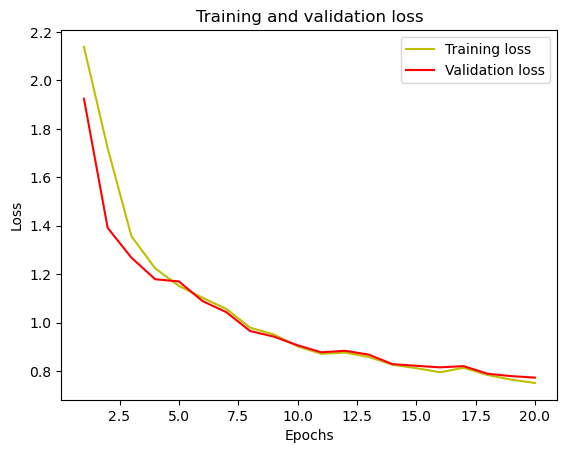

In [55]:
#plot the training and validation accuracy and loss at each epoch
loss = history.history['loss']
val_loss = history.history['val_loss']
epochs = range(1, len(loss) + 1)
plt.plot(epochs, loss, 'y', label='Training loss')
plt.plot(epochs, val_loss, 'r', label='Validation loss')
plt.title('Training and validation loss')
plt.xlabel('Epochs')
plt.ylabel('Loss')
plt.legend()
plt.show()

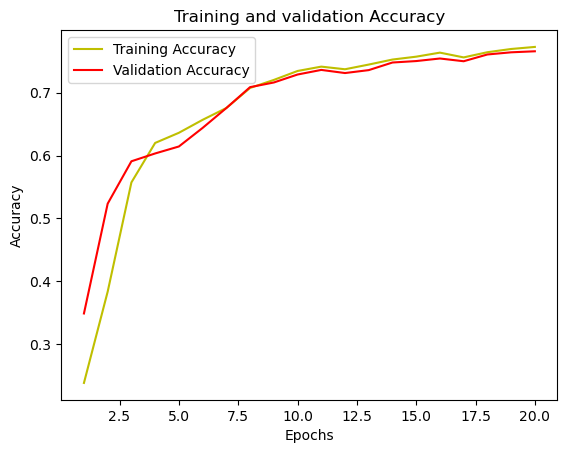

In [56]:
acc = history.history['accuracy']
val_acc = history.history['val_accuracy']
plt.plot(epochs, acc, 'y', label='Training Accuracy')
plt.plot(epochs, val_acc, 'r', label='Validation Accuracy')
plt.title('Training and validation Accuracy')
plt.xlabel('Epochs')
plt.ylabel('Accuracy')
plt.legend()
plt.show()

In [557]:
#NDWI NDVI EVI

In [57]:
################################################################
def multi_input_multiclass_unet_model3(n_classes=1, IMG_HEIGHT=256, IMG_WIDTH=256, IMG_CHANNELS=1):
#Build the model
    inputs_bands = Input((IMG_HEIGHT, IMG_WIDTH, IMG_CHANNELS))
    inputs_indices = Input((IMG_HEIGHT, IMG_WIDTH, IMG_CHANNELS))
    inputs_evi = Input((IMG_HEIGHT, IMG_WIDTH, IMG_CHANNELS))
    inputs_ndwi = Input((IMG_HEIGHT, IMG_WIDTH, IMG_CHANNELS))
    #s = Lambda(lambda x: x / 255)(inputs)   #No need for this if we normalize our inputs beforehand
    s1 = inputs_bands
    s2= inputs_indices
    s3= inputs_evi
    s4= inputs_ndwi
    

    #Contraction path bands
    c1_bands = Conv2D(16, (3, 3), activation='relu', kernel_initializer='he_normal', padding='same')(s1)
    c1_bands = Dropout(0.1)(c1_bands)
    c1_bands = Conv2D(16, (3, 3), activation='relu', kernel_initializer='he_normal', padding='same')(c1_bands)
    p1_bands = MaxPooling2D((2, 2))(c1_bands)
    
    c2_bands = Conv2D(32, (3, 3), activation='relu', kernel_initializer='he_normal', padding='same')(p1_bands)
    c2_bands = Dropout(0.1)(c2_bands)
    c2_bands = Conv2D(32, (3, 3), activation='relu', kernel_initializer='he_normal', padding='same')(c2_bands)
    p2_bands = MaxPooling2D((2, 2))(c2_bands)
     
    c3_bands = Conv2D(64, (3, 3), activation='relu', kernel_initializer='he_normal', padding='same')(p2_bands)
    c3_bands = Dropout(0.2)(c3_bands)
    c3_bands = Conv2D(64, (3, 3), activation='relu', kernel_initializer='he_normal', padding='same')(c3_bands)
    p3_bands = MaxPooling2D((2, 2))(c3_bands)
     
    c4_bands = Conv2D(128, (3, 3), activation='relu', kernel_initializer='he_normal', padding='same')(p3_bands)
    c4_bands = Dropout(0.2)(c4_bands)
    c4_bands = Conv2D(128, (3, 3), activation='relu', kernel_initializer='he_normal', padding='same')(c4_bands)
    p4_bands = MaxPooling2D(pool_size=(2, 2))(c4_bands)
     
    c5_bands = Conv2D(256, (3, 3), activation='relu', kernel_initializer='he_normal', padding='same')(p4_bands)
    c5_bands = Dropout(0.3)(c5_bands)
    c5_bands = Conv2D(256, (3, 3), activation='relu', kernel_initializer='he_normal', padding='same')(c5_bands)
    
    
    
    
    
    
    
    #Contraction path indices  ndvi  
    c1_indices = Conv2D(16, (3, 3), activation='relu', kernel_initializer='he_normal', padding='same')(s2)
    c1_indices = Dropout(0.1)(c1_indices)
    c1_indices = Conv2D(16, (3, 3), activation='relu', kernel_initializer='he_normal', padding='same')(c1_indices)
    p1_indices = MaxPooling2D((2, 2))(c1_indices)
    
    c2_indices = Conv2D(32, (3, 3), activation='relu', kernel_initializer='he_normal', padding='same')(p1_indices)
    c2_indices = Dropout(0.1)(c2_indices)
    c2_indices = Conv2D(32, (3, 3), activation='relu', kernel_initializer='he_normal', padding='same')(c2_indices)
    p2_indices = MaxPooling2D((2, 2))(c2_indices)
     
    c3_indices = Conv2D(64, (3, 3), activation='relu', kernel_initializer='he_normal', padding='same')(p2_indices)
    c3_indices = Dropout(0.2)(c3_indices)
    c3_indices = Conv2D(64, (3, 3), activation='relu', kernel_initializer='he_normal', padding='same')(c3_indices)
    p3_indices = MaxPooling2D((2, 2))(c3_indices)
     
    c4_indices = Conv2D(128, (3, 3), activation='relu', kernel_initializer='he_normal', padding='same')(p3_indices)
    c4_indices = Dropout(0.2)(c4_indices)
    c4_indices = Conv2D(128, (3, 3), activation='relu', kernel_initializer='he_normal', padding='same')(c4_indices)
    p4_indices = MaxPooling2D(pool_size=(2, 2))(c4_indices)
     
    c5_indices = Conv2D(256, (3, 3), activation='relu', kernel_initializer='he_normal', padding='same')(p4_indices)
    c5_indices = Dropout(0.3)(c5_indices)
    c5_indices = Conv2D(256, (3, 3), activation='relu', kernel_initializer='he_normal', padding='same')(c5_indices)    
    

    
    #Contraction path indices    evi
    c1_evi = Conv2D(16, (3, 3), activation='relu', kernel_initializer='he_normal', padding='same')(s3)
    c1_evi = Dropout(0.1)(c1_evi)
    c1_evi = Conv2D(16, (3, 3), activation='relu', kernel_initializer='he_normal', padding='same')(c1_evi)
    p1_evi = MaxPooling2D((2, 2))(c1_evi)
    
    c2_evi = Conv2D(32, (3, 3), activation='relu', kernel_initializer='he_normal', padding='same')(p1_evi)
    c2_evi = Dropout(0.1)(c2_evi)
    c2_evi = Conv2D(32, (3, 3), activation='relu', kernel_initializer='he_normal', padding='same')(c2_evi)
    p2_evi = MaxPooling2D((2, 2))(c2_evi)
     
    c3_evi = Conv2D(64, (3, 3), activation='relu', kernel_initializer='he_normal', padding='same')(p2_evi)
    c3_evi = Dropout(0.2)(c3_evi)
    c3_evi = Conv2D(64, (3, 3), activation='relu', kernel_initializer='he_normal', padding='same')(c3_evi)
    p3_evi = MaxPooling2D((2, 2))(c3_evi)
     
    c4_evi = Conv2D(128, (3, 3), activation='relu', kernel_initializer='he_normal', padding='same')(p3_evi)
    c4_evi = Dropout(0.2)(c4_evi)
    c4_evi = Conv2D(128, (3, 3), activation='relu', kernel_initializer='he_normal', padding='same')(c4_evi)
    p4_evi = MaxPooling2D(pool_size=(2, 2))(c4_evi)
     
    c5_evi = Conv2D(256, (3, 3), activation='relu', kernel_initializer='he_normal', padding='same')(p4_evi)
    c5_evi = Dropout(0.3)(c5_evi)
    c5_evi = Conv2D(256, (3, 3), activation='relu', kernel_initializer='he_normal', padding='same')(c5_evi) 
    
    
    
    

    
    #Contraction path indices    evi NDWI NDVI
    c1_ndwi = Conv2D(16, (3, 3), activation='relu', kernel_initializer='he_normal', padding='same')(s4)
    c1_ndwi = Dropout(0.1)(c1_ndwi)
    c1_ndwi = Conv2D(16, (3, 3), activation='relu', kernel_initializer='he_normal', padding='same')(c1_ndwi)
    p1_ndwi = MaxPooling2D((2, 2))(c1_ndwi)
    
    c2_ndwi = Conv2D(32, (3, 3), activation='relu', kernel_initializer='he_normal', padding='same')(p1_ndwi)
    c2_ndwi = Dropout(0.1)(c2_ndwi)
    c2_ndwi = Conv2D(32, (3, 3), activation='relu', kernel_initializer='he_normal', padding='same')(c2_ndwi)
    p2_ndwi = MaxPooling2D((2, 2))(c2_ndwi)
     
    c3_ndwi = Conv2D(64, (3, 3), activation='relu', kernel_initializer='he_normal', padding='same')(p2_ndwi)
    c3_ndwi = Dropout(0.2)(c3_ndwi)
    c3_ndwi = Conv2D(64, (3, 3), activation='relu', kernel_initializer='he_normal', padding='same')(c3_ndwi)
    p3_ndwi = MaxPooling2D((2, 2))(c3_ndwi)
     
    c4_ndwi = Conv2D(128, (3, 3), activation='relu', kernel_initializer='he_normal', padding='same')(p3_ndwi)
    c4_ndwi = Dropout(0.2)(c4_ndwi)
    c4_ndwi = Conv2D(128, (3, 3), activation='relu', kernel_initializer='he_normal', padding='same')(c4_ndwi)
    p4_ndwi = MaxPooling2D(pool_size=(2, 2))(c4_ndwi)
     
    c5_ndwi = Conv2D(256, (3, 3), activation='relu', kernel_initializer='he_normal', padding='same')(p4_ndwi)
    c5_ndwi = Dropout(0.3)(c5_ndwi)
    c5_ndwi = Conv2D(256, (3, 3), activation='relu', kernel_initializer='he_normal', padding='same')(c5_ndwi) 
    
    
    
    merged = concatenate([c5_bands, c5_indices,c5_evi,c5_ndwi])  # Add more data sources as needed    
    
    
    
    #Expansive path 
    u6_bands = Conv2DTranspose(128, (2, 2), strides=(2, 2), padding='same')(merged)
    u6_bands = concatenate([u6_bands, c4_bands,c4_indices,c4_evi,c4_ndwi])
    c6_bands = Conv2D(128, (3, 3), activation='relu', kernel_initializer='he_normal', padding='same')(u6_bands)
    c6_bands = Dropout(0.2)(c6_bands)
    c6_bands = Conv2D(128, (3, 3), activation='relu', kernel_initializer='he_normal', padding='same')(c6_bands)
     
    u7_bands = Conv2DTranspose(64, (2, 2), strides=(2, 2), padding='same')(c6_bands)
    u7_bands = concatenate([u7_bands, c3_bands,c3_indices,c3_evi,c3_ndwi])
    c7_bands = Conv2D(64, (3, 3), activation='relu', kernel_initializer='he_normal', padding='same')(u7_bands)
    c7_bands = Dropout(0.2)(c7_bands)
    c7_bands = Conv2D(64, (3, 3), activation='relu', kernel_initializer='he_normal', padding='same')(c7_bands)
     
    u8_bands = Conv2DTranspose(32, (2, 2), strides=(2, 2), padding='same')(c7_bands)
    u8_bands = concatenate([u8_bands, c2_bands,c2_indices,c2_evi,c2_ndwi])
    c8_bands = Conv2D(32, (3, 3), activation='relu', kernel_initializer='he_normal', padding='same')(u8_bands)
    c8_bands = Dropout(0.1)(c8_bands)
    c8_bands = Conv2D(32, (3, 3), activation='relu', kernel_initializer='he_normal', padding='same')(c8_bands)
     
    u9_bands = Conv2DTranspose(16, (2, 2), strides=(2, 2), padding='same')(c8_bands)
    u9_bands = concatenate([u9_bands, c1_bands,c1_indices,c1_evi,c1_ndwi], axis=3)
    c9_bands = Conv2D(16, (3, 3), activation='relu', kernel_initializer='he_normal', padding='same')(u9_bands)
    c9_bands = Dropout(0.1)(c9_bands)
    c9_bands = Conv2D(16, (3, 3), activation='relu', kernel_initializer='he_normal', padding='same')(c9_bands)
     
    outputs = Conv2D(n_classes, (1, 1), activation='softmax')(c9_bands)
     
    model = Model(inputs=[inputs_bands,inputs_indices,inputs_evi,inputs_ndwi], outputs=[outputs])
    
    #NOTE: Compile the model in the main program to make it easy to test with various loss functions
    #model.compile(optimizer='adam', loss='binary_crossentropy', metrics=['accuracy'])
    
    #model.summary()
    
    return model
 

In [58]:
def get_model():
    return multi_input_multiclass_unet_model3(n_classes=10, IMG_HEIGHT=256, IMG_WIDTH=256, IMG_CHANNELS=1)

In [59]:
model = get_model()

In [60]:
model.compile(optimizer='adam', loss='categorical_crossentropy', metrics=['accuracy'])

In [61]:
model.summary()

Model: "model_2"
__________________________________________________________________________________________________
 Layer (type)                Output Shape                 Param #   Connected to                  
 input_8 (InputLayer)        [(None, 256, 256, 1)]        0         []                            
                                                                                                  
 input_9 (InputLayer)        [(None, 256, 256, 1)]        0         []                            
                                                                                                  
 input_10 (InputLayer)       [(None, 256, 256, 1)]        0         []                            
                                                                                                  
 input_11 (InputLayer)       [(None, 256, 256, 1)]        0         []                            
                                                                                            

In [75]:
history = model.fit([X5,X6,X13], y_train_cat, 
                    batch_size = 8, 
                    verbose=1, 
                    epochs=20, 
                    validation_data=([X_test5,X_test6,X_test13], y_test_cat), 
                    #class_weight=class_weights,
                    shuffle=False)

Epoch 1/20
16/16 [==============================] - 27s 1s/step - loss: 1.6326 - accuracy: 0.3055 - val_loss: 1.4081 - val_accuracy: 0.4178
Epoch 2/20
16/16 [==============================] - 18s 1s/step - loss: 1.4962 - accuracy: 0.3637 - val_loss: 1.3127 - val_accuracy: 0.4800
Epoch 3/20
16/16 [==============================] - 19s 1s/step - loss: 1.3551 - accuracy: 0.4488 - val_loss: 1.1845 - val_accuracy: 0.5718
Epoch 4/20
16/16 [==============================] - 19s 1s/step - loss: 1.2667 - accuracy: 0.4916 - val_loss: 1.1020 - val_accuracy: 0.5803
Epoch 5/20
16/16 [==============================] - 20s 1s/step - loss: 1.1925 - accuracy: 0.5177 - val_loss: 1.0310 - val_accuracy: 0.6382
Epoch 6/20
16/16 [==============================] - 19s 1s/step - loss: 1.1242 - accuracy: 0.5528 - val_loss: 0.9649 - val_accuracy: 0.6437
Epoch 7/20
 6/16 [==========>...................] - ETA: 12s - loss: 0.9654 - accuracy: 0.6326

KeyboardInterrupt: 

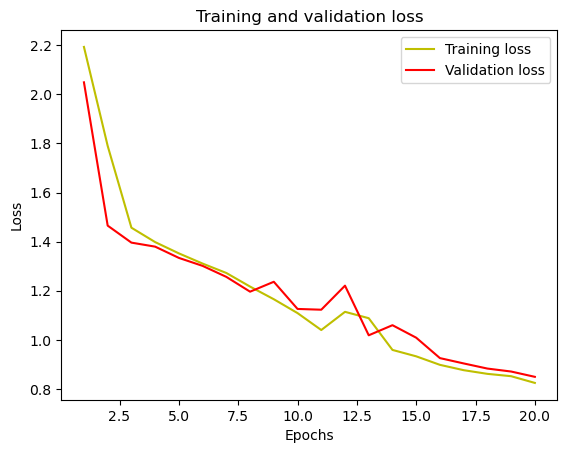

In [63]:
#plot the training and validation accuracy and loss at each epoch
loss = history.history['loss']
val_loss = history.history['val_loss']
epochs = range(1, len(loss) + 1)
plt.plot(epochs, loss, 'y', label='Training loss')
plt.plot(epochs, val_loss, 'r', label='Validation loss')
plt.title('Training and validation loss')
plt.xlabel('Epochs')
plt.ylabel('Loss')
plt.legend()
plt.show()

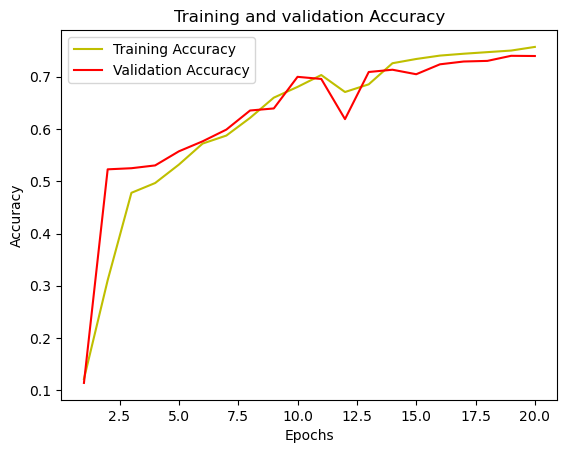

In [64]:
acc = history.history['accuracy']
val_acc = history.history['val_accuracy']
plt.plot(epochs, acc, 'y', label='Training Accuracy')
plt.plot(epochs, val_acc, 'r', label='Validation Accuracy')
plt.title('Training and validation Accuracy')
plt.xlabel('Epochs')
plt.ylabel('Accuracy')
plt.legend()
plt.show()

In [ ]:
#13 input_final

In [64]:
################################################################
def multi_input_multiclass_unet_model(n_classes=6, IMG_HEIGHT=64, IMG_WIDTH=64, IMG_CHANNELS=1):
#Build the model

    inputs_ndvis = Input((IMG_HEIGHT, IMG_WIDTH, IMG_CHANNELS))
    inputs_evis = Input((IMG_HEIGHT, IMG_WIDTH, IMG_CHANNELS))
    inputs_ndwis = Input((IMG_HEIGHT, IMG_WIDTH, IMG_CHANNELS))
    inputs_nirs = Input((IMG_HEIGHT, IMG_WIDTH, IMG_CHANNELS))
    inputs_reds = Input((IMG_HEIGHT, IMG_WIDTH, IMG_CHANNELS))
    inputs_swirs = Input((IMG_HEIGHT, IMG_WIDTH, IMG_CHANNELS))
    inputs_tirs = Input((IMG_HEIGHT, IMG_WIDTH, IMG_CHANNELS))
    inputs_conts = Input((IMG_HEIGHT, IMG_WIDTH, IMG_CHANNELS))
    inputs_disss = Input((IMG_HEIGHT, IMG_WIDTH, IMG_CHANNELS))
    inputs_corrs = Input((IMG_HEIGHT, IMG_WIDTH, IMG_CHANNELS))
    inputs_slps = Input((IMG_HEIGHT, IMG_WIDTH, IMG_CHANNELS))
    inputs_asps = Input((IMG_HEIGHT, IMG_WIDTH, IMG_CHANNELS))
    inputs_elvs = Input((IMG_HEIGHT, IMG_WIDTH, IMG_CHANNELS))                                            
    
    #s = Lambda(lambda x: x / 255)(inputs)   #No need for this if we normalize our inputs beforehand
    s1 = inputs_ndvis
    s2= inputs_evis
    s3=inputs_ndwis
    s4=inputs_nirs
    s5=inputs_reds
    s6=inputs_swirs
    s7=inputs_tirs
    s8=inputs_conts
    s9=inputs_disss
    s10=inputs_corrs
    s11=inputs_slps
    s12=inputs_asps
    s13=inputs_asps

    #Contraction path NDVI
    c1_ndvi = Conv2D(16, (3, 3), activation='relu', kernel_initializer='he_normal', padding='same')(s1)
    c1_ndvi = Dropout(0.1)(c1_ndvi)
    c1_ndvi = Conv2D(16, (3, 3), activation='relu', kernel_initializer='he_normal', padding='same')(c1_ndvi)
    p1_ndvi = MaxPooling2D((2, 2))(c1_ndvi)
    
    c2_ndvi = Conv2D(32, (3, 3), activation='relu', kernel_initializer='he_normal', padding='same')(p1_ndvi)
    c2_ndvi = Dropout(0.1)(c2_ndvi)
    c2_ndvi = Conv2D(32, (3, 3), activation='relu', kernel_initializer='he_normal', padding='same')(c2_ndvi)
    p2_ndvi = MaxPooling2D((2, 2))(c2_ndvi)
     
    c3_ndvi = Conv2D(64, (3, 3), activation='relu', kernel_initializer='he_normal', padding='same')(p2_ndvi)
    c3_ndvi = Dropout(0.2)(c3_ndvi)
    c3_ndvi = Conv2D(64, (3, 3), activation='relu', kernel_initializer='he_normal', padding='same')(c3_ndvi)
    p3_ndvi = MaxPooling2D((2, 2))(c3_ndvi)
     
    c4_ndvi = Conv2D(128, (3, 3), activation='relu', kernel_initializer='he_normal', padding='same')(p3_ndvi)
    c4_ndvi = Dropout(0.2)(c4_ndvi)
    c4_ndvi = Conv2D(128, (3, 3), activation='relu', kernel_initializer='he_normal', padding='same')(c4_ndvi)
    p4_ndvi = MaxPooling2D(pool_size=(2, 2))(c4_ndvi)
     
    c5_ndvi = Conv2D(256, (3, 3), activation='relu', kernel_initializer='he_normal', padding='same')(p4_ndvi)
    c5_ndvi = Dropout(0.3)(c5_ndvi)
    c5_ndvi = Conv2D(256, (3, 3), activation='relu', kernel_initializer='he_normal', padding='same')(c5_ndvi)
    
    
    
    
    
    
    
    #Contraction path indices  EVI 
    c1_evi = Conv2D(16, (3, 3), activation='relu', kernel_initializer='he_normal', padding='same')(s2)
    c1_evi = Dropout(0.1)(c1_evi)
    c1_evi = Conv2D(16, (3, 3), activation='relu', kernel_initializer='he_normal', padding='same')(c1_evi)
    p1_evi = MaxPooling2D((2, 2))(c1_evi)
    
    c2_evi = Conv2D(32, (3, 3), activation='relu', kernel_initializer='he_normal', padding='same')(p1_evi)
    c2_evi = Dropout(0.1)(c2_evi)
    c2_evi = Conv2D(32, (3, 3), activation='relu', kernel_initializer='he_normal', padding='same')(c2_evi)
    p2_evi = MaxPooling2D((2, 2))(c2_evi)
     
    c3_evi = Conv2D(64, (3, 3), activation='relu', kernel_initializer='he_normal', padding='same')(p2_evi)
    c3_evi = Dropout(0.2)(c3_evi)
    c3_evi = Conv2D(64, (3, 3), activation='relu', kernel_initializer='he_normal', padding='same')(c3_evi)
    p3_evi = MaxPooling2D((2, 2))(c3_evi)
     
    c4_evi = Conv2D(128, (3, 3), activation='relu', kernel_initializer='he_normal', padding='same')(p3_evi)
    c4_evi = Dropout(0.2)(c4_evi)
    c4_evi = Conv2D(128, (3, 3), activation='relu', kernel_initializer='he_normal', padding='same')(c4_evi)
    p4_evi = MaxPooling2D(pool_size=(2, 2))(c4_evi)
     
    c5_evi = Conv2D(256, (3, 3), activation='relu', kernel_initializer='he_normal', padding='same')(p4_evi)
    c5_evi = Dropout(0.3)(c5_evi)
    c5_evi = Conv2D(256, (3, 3), activation='relu', kernel_initializer='he_normal', padding='same')(c5_evi)    
    
    
     
    
    #Contraction path indices  NDWI  
    c1_ndwi = Conv2D(16, (3, 3), activation='relu', kernel_initializer='he_normal', padding='same')(s3)
    c1_ndwi = Dropout(0.1)(c1_ndwi)
    c1_ndwi = Conv2D(16, (3, 3), activation='relu', kernel_initializer='he_normal', padding='same')(c1_ndwi)
    p1_ndwi = MaxPooling2D((2, 2))(c1_ndwi)
    
    c2_ndwi = Conv2D(32, (3, 3), activation='relu', kernel_initializer='he_normal', padding='same')(p1_ndwi)
    c2_ndwi = Dropout(0.1)(c2_ndwi)
    c2_ndwi = Conv2D(32, (3, 3), activation='relu', kernel_initializer='he_normal', padding='same')(c2_ndwi)
    p2_ndwi = MaxPooling2D((2, 2))(c2_ndwi)
     
    c3_ndwi = Conv2D(64, (3, 3), activation='relu', kernel_initializer='he_normal', padding='same')(p2_ndwi)
    c3_ndwi = Dropout(0.2)(c3_ndwi)
    c3_ndwi = Conv2D(64, (3, 3), activation='relu', kernel_initializer='he_normal', padding='same')(c3_ndwi)
    p3_ndwi = MaxPooling2D((2, 2))(c3_ndwi)
     
    c4_ndwi = Conv2D(128, (3, 3), activation='relu', kernel_initializer='he_normal', padding='same')(p3_ndwi)
    c4_ndwi = Dropout(0.2)(c4_ndwi)
    c4_ndwi = Conv2D(128, (3, 3), activation='relu', kernel_initializer='he_normal', padding='same')(c4_ndwi)
    p4_ndwi = MaxPooling2D(pool_size=(2, 2))(c4_ndwi)
     
    c5_ndwi = Conv2D(256, (3, 3), activation='relu', kernel_initializer='he_normal', padding='same')(p4_ndwi)
    c5_ndwi = Dropout(0.3)(c5_ndwi)
    c5_ndwi = Conv2D(256, (3, 3), activation='relu', kernel_initializer='he_normal', padding='same')(c5_ndwi)   


    
    
    #Contraction path indices  NIRnir  
    c1_nir = Conv2D(16, (3, 3), activation='relu', kernel_initializer='he_normal', padding='same')(s4)
    c1_nir = Dropout(0.1)(c1_nir)
    c1_nir = Conv2D(16, (3, 3), activation='relu', kernel_initializer='he_normal', padding='same')(c1_nir)
    p1_nir = MaxPooling2D((2, 2))(c1_nir)
    
    c2_nir = Conv2D(32, (3, 3), activation='relu', kernel_initializer='he_normal', padding='same')(p1_nir)
    c2_nir = Dropout(0.1)(c2_nir)
    c2_nir = Conv2D(32, (3, 3), activation='relu', kernel_initializer='he_normal', padding='same')(c2_nir)
    p2_nir = MaxPooling2D((2, 2))(c2_nir)
     
    c3_nir = Conv2D(64, (3, 3), activation='relu', kernel_initializer='he_normal', padding='same')(p2_nir)
    c3_nir = Dropout(0.2)(c3_nir)
    c3_nir = Conv2D(64, (3, 3), activation='relu', kernel_initializer='he_normal', padding='same')(c3_nir)
    p3_nir = MaxPooling2D((2, 2))(c3_nir)
     
    c4_nir = Conv2D(128, (3, 3), activation='relu', kernel_initializer='he_normal', padding='same')(p3_nir)
    c4_nir = Dropout(0.2)(c4_nir)
    c4_nir = Conv2D(128, (3, 3), activation='relu', kernel_initializer='he_normal', padding='same')(c4_nir)
    p4_nir = MaxPooling2D(pool_size=(2, 2))(c4_nir)
     
    c5_nir = Conv2D(256, (3, 3), activation='relu', kernel_initializer='he_normal', padding='same')(p4_nir)
    c5_nir = Dropout(0.3)(c5_nir)
    c5_nir = Conv2D(256, (3, 3), activation='relu', kernel_initializer='he_normal', padding='same')(c5_nir)   


    
    
    #Contraction path indices  RED  
    c1_red = Conv2D(16, (3, 3), activation='relu', kernel_initializer='he_normal', padding='same')(s5)
    c1_red = Dropout(0.1)(c1_red)
    c1_red = Conv2D(16, (3, 3), activation='relu', kernel_initializer='he_normal', padding='same')(c1_red)
    p1_red = MaxPooling2D((2, 2))(c1_red)
    
    c2_red = Conv2D(32, (3, 3), activation='relu', kernel_initializer='he_normal', padding='same')(p1_red)
    c2_red = Dropout(0.1)(c2_red)
    c2_red = Conv2D(32, (3, 3), activation='relu', kernel_initializer='he_normal', padding='same')(c2_red)
    p2_red = MaxPooling2D((2, 2))(c2_red)
     
    c3_red = Conv2D(64, (3, 3), activation='relu', kernel_initializer='he_normal', padding='same')(p2_red)
    c3_red = Dropout(0.2)(c3_red)
    c3_red = Conv2D(64, (3, 3), activation='relu', kernel_initializer='he_normal', padding='same')(c3_red)
    p3_red = MaxPooling2D((2, 2))(c3_red)
     
    c4_red = Conv2D(128, (3, 3), activation='relu', kernel_initializer='he_normal', padding='same')(p3_red)
    c4_red = Dropout(0.2)(c4_red)
    c4_red = Conv2D(128, (3, 3), activation='relu', kernel_initializer='he_normal', padding='same')(c4_red)
    p4_red = MaxPooling2D(pool_size=(2, 2))(c4_red)
     
    c5_red = Conv2D(256, (3, 3), activation='relu', kernel_initializer='he_normal', padding='same')(p4_red)
    c5_red = Dropout(0.3)(c5_red)
    c5_red = Conv2D(256, (3, 3), activation='relu', kernel_initializer='he_normal', padding='same')(c5_red)   


    
    
    #Contraction path indices  SWIR  swir
    c1_swir = Conv2D(16, (3, 3), activation='relu', kernel_initializer='he_normal', padding='same')(s6)
    c1_swir = Dropout(0.1)(c1_swir)
    c1_swir = Conv2D(16, (3, 3), activation='relu', kernel_initializer='he_normal', padding='same')(c1_swir)
    p1_swir = MaxPooling2D((2, 2))(c1_swir)
    
    c2_swir = Conv2D(32, (3, 3), activation='relu', kernel_initializer='he_normal', padding='same')(p1_swir)
    c2_swir = Dropout(0.1)(c2_swir)
    c2_swir = Conv2D(32, (3, 3), activation='relu', kernel_initializer='he_normal', padding='same')(c2_swir)
    p2_swir = MaxPooling2D((2, 2))(c2_swir)
     
    c3_swir = Conv2D(64, (3, 3), activation='relu', kernel_initializer='he_normal', padding='same')(p2_swir)
    c3_swir = Dropout(0.2)(c3_swir)
    c3_swir = Conv2D(64, (3, 3), activation='relu', kernel_initializer='he_normal', padding='same')(c3_swir)
    p3_swir = MaxPooling2D((2, 2))(c3_swir)
     
    c4_swir = Conv2D(128, (3, 3), activation='relu', kernel_initializer='he_normal', padding='same')(p3_swir)
    c4_swir = Dropout(0.2)(c4_swir)
    c4_swir = Conv2D(128, (3, 3), activation='relu', kernel_initializer='he_normal', padding='same')(c4_swir)
    p4_swir = MaxPooling2D(pool_size=(2, 2))(c4_swir)
     
    c5_swir = Conv2D(256, (3, 3), activation='relu', kernel_initializer='he_normal', padding='same')(p4_swir)
    c5_swir = Dropout(0.3)(c5_swir)
    c5_swir = Conv2D(256, (3, 3), activation='relu', kernel_initializer='he_normal', padding='same')(c5_swir)   


    
    
    #Contraction path indices  TIRS  tir
    c1_tir = Conv2D(16, (3, 3), activation='relu', kernel_initializer='he_normal', padding='same')(s7)
    c1_tir = Dropout(0.1)(c1_tir)
    c1_tir = Conv2D(16, (3, 3), activation='relu', kernel_initializer='he_normal', padding='same')(c1_tir)
    p1_tir = MaxPooling2D((2, 2))(c1_tir)
    
    c2_tir = Conv2D(32, (3, 3), activation='relu', kernel_initializer='he_normal', padding='same')(p1_tir)
    c2_tir = Dropout(0.1)(c2_tir)
    c2_tir = Conv2D(32, (3, 3), activation='relu', kernel_initializer='he_normal', padding='same')(c2_tir)
    p2_tir = MaxPooling2D((2, 2))(c2_tir)
     
    c3_tir = Conv2D(64, (3, 3), activation='relu', kernel_initializer='he_normal', padding='same')(p2_tir)
    c3_tir = Dropout(0.2)(c3_tir)
    c3_tir = Conv2D(64, (3, 3), activation='relu', kernel_initializer='he_normal', padding='same')(c3_tir)
    p3_tir = MaxPooling2D((2, 2))(c3_tir)
     
    c4_tir = Conv2D(128, (3, 3), activation='relu', kernel_initializer='he_normal', padding='same')(p3_tir)
    c4_tir = Dropout(0.2)(c4_tir)
    c4_tir = Conv2D(128, (3, 3), activation='relu', kernel_initializer='he_normal', padding='same')(c4_tir)
    p4_tir = MaxPooling2D(pool_size=(2, 2))(c4_tir)
     
    c5_tir = Conv2D(256, (3, 3), activation='relu', kernel_initializer='he_normal', padding='same')(p4_tir)
    c5_tir = Dropout(0.3)(c5_tir)
    c5_tir = Conv2D(256, (3, 3), activation='relu', kernel_initializer='he_normal', padding='same')(c5_tir)   


    
    
    #Contraction path indices  CONTRAST  
    c1_cont = Conv2D(16, (3, 3), activation='relu', kernel_initializer='he_normal', padding='same')(s8)
    c1_cont = Dropout(0.1)(c1_cont)
    c1_cont = Conv2D(16, (3, 3), activation='relu', kernel_initializer='he_normal', padding='same')(c1_cont)
    p1_cont = MaxPooling2D((2, 2))(c1_cont)
    
    c2_cont = Conv2D(32, (3, 3), activation='relu', kernel_initializer='he_normal', padding='same')(p1_cont)
    c2_cont = Dropout(0.1)(c2_cont)
    c2_cont = Conv2D(32, (3, 3), activation='relu', kernel_initializer='he_normal', padding='same')(c2_cont)
    p2_cont = MaxPooling2D((2, 2))(c2_cont)
     
    c3_cont = Conv2D(64, (3, 3), activation='relu', kernel_initializer='he_normal', padding='same')(p2_cont)
    c3_cont = Dropout(0.2)(c3_cont)
    c3_cont = Conv2D(64, (3, 3), activation='relu', kernel_initializer='he_normal', padding='same')(c3_cont)
    p3_cont = MaxPooling2D((2, 2))(c3_cont)
     
    c4_cont = Conv2D(128, (3, 3), activation='relu', kernel_initializer='he_normal', padding='same')(p3_cont)
    c4_cont = Dropout(0.2)(c4_cont)
    c4_cont = Conv2D(128, (3, 3), activation='relu', kernel_initializer='he_normal', padding='same')(c4_cont)
    p4_cont = MaxPooling2D(pool_size=(2, 2))(c4_cont)
     
    c5_cont = Conv2D(256, (3, 3), activation='relu', kernel_initializer='he_normal', padding='same')(p4_cont)
    c5_cont = Dropout(0.3)(c5_cont)
    c5_cont = Conv2D(256, (3, 3), activation='relu', kernel_initializer='he_normal', padding='same')(c5_cont)   


    
    
    #Contraction path indices  DISSIMILARITY
    c1_diss = Conv2D(16, (3, 3), activation='relu', kernel_initializer='he_normal', padding='same')(s9)
    c1_diss = Dropout(0.1)(c1_diss)
    c1_diss = Conv2D(16, (3, 3), activation='relu', kernel_initializer='he_normal', padding='same')(c1_diss)
    p1_diss = MaxPooling2D((2, 2))(c1_diss)
    
    c2_diss = Conv2D(32, (3, 3), activation='relu', kernel_initializer='he_normal', padding='same')(p1_diss)
    c2_diss = Dropout(0.1)(c2_diss)
    c2_diss = Conv2D(32, (3, 3), activation='relu', kernel_initializer='he_normal', padding='same')(c2_diss)
    p2_diss = MaxPooling2D((2, 2))(c2_diss)
     
    c3_diss = Conv2D(64, (3, 3), activation='relu', kernel_initializer='he_normal', padding='same')(p2_diss)
    c3_diss = Dropout(0.2)(c3_diss)
    c3_diss = Conv2D(64, (3, 3), activation='relu', kernel_initializer='he_normal', padding='same')(c3_diss)
    p3_diss = MaxPooling2D((2, 2))(c3_diss)
     
    c4_diss = Conv2D(128, (3, 3), activation='relu', kernel_initializer='he_normal', padding='same')(p3_diss)
    c4_diss = Dropout(0.2)(c4_diss)
    c4_diss = Conv2D(128, (3, 3), activation='relu', kernel_initializer='he_normal', padding='same')(c4_diss)
    p4_diss = MaxPooling2D(pool_size=(2, 2))(c4_diss)
     
    c5_diss = Conv2D(256, (3, 3), activation='relu', kernel_initializer='he_normal', padding='same')(p4_diss)
    c5_diss = Dropout(0.3)(c5_diss)
    c5_diss = Conv2D(256, (3, 3), activation='relu', kernel_initializer='he_normal', padding='same')(c5_diss)   


    
    
    #Contraction path indices  CORRELATION
    c1_corr = Conv2D(16, (3, 3), activation='relu', kernel_initializer='he_normal', padding='same')(s10)
    c1_corr = Dropout(0.1)(c1_corr)
    c1_corr = Conv2D(16, (3, 3), activation='relu', kernel_initializer='he_normal', padding='same')(c1_corr)
    p1_corr = MaxPooling2D((2, 2))(c1_corr)
    
    c2_corr = Conv2D(32, (3, 3), activation='relu', kernel_initializer='he_normal', padding='same')(p1_corr)
    c2_corr = Dropout(0.1)(c2_corr)
    c2_corr = Conv2D(32, (3, 3), activation='relu', kernel_initializer='he_normal', padding='same')(c2_corr)
    p2_corr = MaxPooling2D((2, 2))(c2_corr)
     
    c3_corr = Conv2D(64, (3, 3), activation='relu', kernel_initializer='he_normal', padding='same')(p2_corr)
    c3_corr = Dropout(0.2)(c3_corr)
    c3_corr = Conv2D(64, (3, 3), activation='relu', kernel_initializer='he_normal', padding='same')(c3_corr)
    p3_corr = MaxPooling2D((2, 2))(c3_corr)
     
    c4_corr = Conv2D(128, (3, 3), activation='relu', kernel_initializer='he_normal', padding='same')(p3_corr)
    c4_corr = Dropout(0.2)(c4_corr)
    c4_corr = Conv2D(128, (3, 3), activation='relu', kernel_initializer='he_normal', padding='same')(c4_corr)
    p4_corr = MaxPooling2D(pool_size=(2, 2))(c4_corr)
     
    c5_corr = Conv2D(256, (3, 3), activation='relu', kernel_initializer='he_normal', padding='same')(p4_corr)
    c5_corr = Dropout(0.3)(c5_corr)
    c5_corr = Conv2D(256, (3, 3), activation='relu', kernel_initializer='he_normal', padding='same')(c5_corr)   


    
    
    #Contraction path indices  Slope  
    c1_slp = Conv2D(16, (3, 3), activation='relu', kernel_initializer='he_normal', padding='same')(s11)
    c1_slp = Dropout(0.1)(c1_slp)
    c1_slp = Conv2D(16, (3, 3), activation='relu', kernel_initializer='he_normal', padding='same')(c1_slp)
    p1_slp = MaxPooling2D((2, 2))(c1_slp)
    
    c2_slp = Conv2D(32, (3, 3), activation='relu', kernel_initializer='he_normal', padding='same')(p1_slp)
    c2_slp = Dropout(0.1)(c2_slp)
    c2_slp = Conv2D(32, (3, 3), activation='relu', kernel_initializer='he_normal', padding='same')(c2_slp)
    p2_slp = MaxPooling2D((2, 2))(c2_slp)
     
    c3_slp = Conv2D(64, (3, 3), activation='relu', kernel_initializer='he_normal', padding='same')(p2_slp)
    c3_slp = Dropout(0.2)(c3_slp)
    c3_slp = Conv2D(64, (3, 3), activation='relu', kernel_initializer='he_normal', padding='same')(c3_slp)
    p3_slp = MaxPooling2D((2, 2))(c3_slp)
     
    c4_slp = Conv2D(128, (3, 3), activation='relu', kernel_initializer='he_normal', padding='same')(p3_slp)
    c4_slp = Dropout(0.2)(c4_slp)
    c4_slp = Conv2D(128, (3, 3), activation='relu', kernel_initializer='he_normal', padding='same')(c4_slp)
    p4_slp = MaxPooling2D(pool_size=(2, 2))(c4_slp)
     
    c5_slp = Conv2D(256, (3, 3), activation='relu', kernel_initializer='he_normal', padding='same')(p4_slp)
    c5_slp = Dropout(0.3)(c5_slp)
    c5_slp = Conv2D(256, (3, 3), activation='relu', kernel_initializer='he_normal', padding='same')(c5_slp)   


    
    
    #Contraction path indices  Aspect  
    c1_asp = Conv2D(16, (3, 3), activation='relu', kernel_initializer='he_normal', padding='same')(s12)
    c1_asp = Dropout(0.1)(c1_asp)
    c1_asp = Conv2D(16, (3, 3), activation='relu', kernel_initializer='he_normal', padding='same')(c1_asp)
    p1_asp = MaxPooling2D((2, 2))(c1_asp)
    
    c2_asp = Conv2D(32, (3, 3), activation='relu', kernel_initializer='he_normal', padding='same')(p1_asp)
    c2_asp = Dropout(0.1)(c2_asp)
    c2_asp = Conv2D(32, (3, 3), activation='relu', kernel_initializer='he_normal', padding='same')(c2_asp)
    p2_asp = MaxPooling2D((2, 2))(c2_asp)
     
    c3_asp = Conv2D(64, (3, 3), activation='relu', kernel_initializer='he_normal', padding='same')(p2_asp)
    c3_asp = Dropout(0.2)(c3_asp)
    c3_asp = Conv2D(64, (3, 3), activation='relu', kernel_initializer='he_normal', padding='same')(c3_asp)
    p3_asp = MaxPooling2D((2, 2))(c3_asp)
     
    c4_asp = Conv2D(128, (3, 3), activation='relu', kernel_initializer='he_normal', padding='same')(p3_asp)
    c4_asp = Dropout(0.2)(c4_asp)
    c4_asp = Conv2D(128, (3, 3), activation='relu', kernel_initializer='he_normal', padding='same')(c4_asp)
    p4_asp = MaxPooling2D(pool_size=(2, 2))(c4_asp)
     
    c5_asp = Conv2D(256, (3, 3), activation='relu', kernel_initializer='he_normal', padding='same')(p4_asp)
    c5_asp = Dropout(0.3)(c5_asp)
    c5_asp = Conv2D(256, (3, 3), activation='relu', kernel_initializer='he_normal', padding='same')(c5_asp)   


    
    
    #Contraction path indices Elevation  
    c1_elv = Conv2D(16, (3, 3), activation='relu', kernel_initializer='he_normal', padding='same')(s13)
    c1_elv = Dropout(0.1)(c1_elv)
    c1_elv = Conv2D(16, (3, 3), activation='relu', kernel_initializer='he_normal', padding='same')(c1_elv)
    p1_elv = MaxPooling2D((2, 2))(c1_elv)
    
    c2_elv = Conv2D(32, (3, 3), activation='relu', kernel_initializer='he_normal', padding='same')(p1_elv)
    c2_elv = Dropout(0.1)(c2_elv)
    c2_elv = Conv2D(32, (3, 3), activation='relu', kernel_initializer='he_normal', padding='same')(c2_elv)
    p2_elv = MaxPooling2D((2, 2))(c2_elv)
     
    c3_elv = Conv2D(64, (3, 3), activation='relu', kernel_initializer='he_normal', padding='same')(p2_elv)
    c3_elv = Dropout(0.2)(c3_elv)
    c3_elv = Conv2D(64, (3, 3), activation='relu', kernel_initializer='he_normal', padding='same')(c3_elv)
    p3_elv = MaxPooling2D((2, 2))(c3_elv)
     
    c4_elv = Conv2D(128, (3, 3), activation='relu', kernel_initializer='he_normal', padding='same')(p3_elv)
    c4_elv = Dropout(0.2)(c4_elv)
    c4_elv = Conv2D(128, (3, 3), activation='relu', kernel_initializer='he_normal', padding='same')(c4_elv)
    p4_elv = MaxPooling2D(pool_size=(2, 2))(c4_elv)
     
    c5_elv = Conv2D(256, (3, 3), activation='relu', kernel_initializer='he_normal', padding='same')(p4_elv)
    c5_elv = Dropout(0.3)(c5_elv)
    c5_elv = Conv2D(256, (3, 3), activation='relu', kernel_initializer='he_normal', padding='same')(c5_elv)   


    
    merged = concatenate([c5_nir, c5_red,c5_swir, c5_tir,c5_ndvi,c5_evi,c5_ndwi,c5_cont,c5_diss,c5_corr,c5_slp,c5_asp,c5_elv])  # Add more data sources as needed    
    
    
    
    #Expansive path 
    u6_bands = Conv2DTranspose(128, (2, 2), strides=(2, 2), padding='same')(merged)
    u6_bands = concatenate([u6_bands, c4_nir, c4_red,c4_swir, c4_tir,c4_ndvi,c4_evi,c4_ndwi,c4_cont,c4_diss,c4_corr,c4_slp,c4_asp,c4_elv])
    c6_bands = Conv2D(128, (3, 3), activation='relu', kernel_initializer='he_normal', padding='same')(u6_bands)
    c6_bands = Dropout(0.2)(c6_bands)
    c6_bands = Conv2D(128, (3, 3), activation='relu', kernel_initializer='he_normal', padding='same')(c6_bands)
     
    u7_bands = Conv2DTranspose(64, (2, 2), strides=(2, 2), padding='same')(c6_bands)
    u7_bands = concatenate([u7_bands, c3_nir, c3_red,c3_swir, c3_tir,c3_ndvi,c3_evi,c3_ndwi,c3_cont,c3_diss,c3_corr,c3_slp,c3_asp,c3_elv])
    c7_bands = Conv2D(64, (3, 3), activation='relu', kernel_initializer='he_normal', padding='same')(u7_bands)
    c7_bands = Dropout(0.2)(c7_bands)
    c7_bands = Conv2D(64, (3, 3), activation='relu', kernel_initializer='he_normal', padding='same')(c7_bands)
     
    u8_bands = Conv2DTranspose(32, (2, 2), strides=(2, 2), padding='same')(c7_bands)
    u8_bands = concatenate([u8_bands, c2_nir, c2_red,c2_swir, c2_tir,c2_ndvi,c2_evi,c2_ndwi,c2_cont,c2_diss,c2_corr,c2_slp,c2_asp,c2_elv])
    c8_bands = Conv2D(32, (3, 3), activation='relu', kernel_initializer='he_normal', padding='same')(u8_bands)
    c8_bands = Dropout(0.1)(c8_bands)
    c8_bands = Conv2D(32, (3, 3), activation='relu', kernel_initializer='he_normal', padding='same')(c8_bands)
     
    u9_bands = Conv2DTranspose(16, (2, 2), strides=(2, 2), padding='same')(c8_bands)
    u9_bands = concatenate([u9_bands, c1_nir, c1_red,c1_swir, c1_tir,c1_ndvi,c1_evi,c1_ndwi,c1_cont,c1_diss,c1_corr,c1_slp,c1_asp,c1_elv], axis=3)
    c9_bands = Conv2D(16, (3, 3), activation='relu', kernel_initializer='he_normal', padding='same')(u9_bands)
    c9_bands = Dropout(0.1)(c9_bands)
    c9_bands = Conv2D(16, (3, 3), activation='relu', kernel_initializer='he_normal', padding='same')(c9_bands)
     
    outputs = Conv2D(n_classes, (1, 1), activation='softmax')(c9_bands)
     
    model = Model(inputs=[inputs_ndvis,inputs_evis,inputs_ndwis,inputs_nirs,inputs_reds,inputs_swirs,inputs_tirs,inputs_conts,inputs_disss,inputs_corrs,inputs_slps,inputs_asps,inputs_elvs], outputs=[outputs])
    
    #NOTE: Compile the model in the main program to make it easy to test with various loss functions
    #model.compile(optimizer='adam', loss='binary_crossentropy', metrics=['accuracy'])
    
    #model.summary()
    
    return model
 

In [65]:
def get_model():
    return multi_input_multiclass_unet_model(n_classes=6, IMG_HEIGHT=64, IMG_WIDTH=64, IMG_CHANNELS=1)

In [66]:
model = get_model()

In [67]:
model.summary()

Model: "model"
__________________________________________________________________________________________________
 Layer (type)                Output Shape                 Param #   Connected to                  
 input_4 (InputLayer)        [(None, 64, 64, 1)]          0         []                            
                                                                                                  
 input_5 (InputLayer)        [(None, 64, 64, 1)]          0         []                            
                                                                                                  
 input_6 (InputLayer)        [(None, 64, 64, 1)]          0         []                            
                                                                                                  
 input_7 (InputLayer)        [(None, 64, 64, 1)]          0         []                            
                                                                                              

In [68]:
model.compile(optimizer='adam', loss='categorical_crossentropy', metrics=['accuracy'])

In [69]:
history = model.fit([X5,X7,X6,X13,X1,X2,X3,X4,X9,X10,X8,X12,X11], y_train_cat, 
                    batch_size = 8, 
                    verbose=1, 
                    epochs=20, 
                    validation_data=([X_test5,X_test7,X_test6,X_test13,X_test1,X_test2,X_test3,X_test4,X_test9,X_test10,X_test8,X_test12,X_test11], y_test_cat), 
                    class_weight=class_weights,
                    shuffle=False)

Epoch 1/20
102/102 [==============================] - 159s 1s/step - loss: 1.3711 - accuracy: 0.2821 - val_loss: 1.2954 - val_accuracy: 0.4255
Epoch 2/20
102/102 [==============================] - 138s 1s/step - loss: 0.9414 - accuracy: 0.5947 - val_loss: 0.9128 - val_accuracy: 0.6449
Epoch 3/20
102/102 [==============================] - 140s 1s/step - loss: 0.7764 - accuracy: 0.6767 - val_loss: 0.7854 - val_accuracy: 0.6989
Epoch 4/20
102/102 [==============================] - 139s 1s/step - loss: 0.7102 - accuracy: 0.7017 - val_loss: 0.7809 - val_accuracy: 0.6972
Epoch 5/20
102/102 [==============================] - 139s 1s/step - loss: 0.6908 - accuracy: 0.7108 - val_loss: 0.7192 - val_accuracy: 0.7152
Epoch 6/20
102/102 [==============================] - 139s 1s/step - loss: 0.6556 - accuracy: 0.7215 - val_loss: 0.6888 - val_accuracy: 0.7271
Epoch 7/20
102/102 [==============================] - 139s 1s/step - loss: 0.6350 - accuracy: 0.7296 - val_loss: 0.6649 - val_accuracy: 0.7364

In [70]:
model.save('unet_input_20epoch_re.hdf5')

C:\Users\mrg22-020914479\.conda\envs\TestDL\Lib\site-packages\keras\src\engine\training.py:3000: UserWarning: You are saving your model as an HDF5 file via `model.save()`. This file format is considered legacy. We recommend using instead the native Keras format, e.g. `model.save('my_model.keras')`.
  saving_api.save_model(


In [71]:
import os

# Get the current working directory
current_directory = os.getcwd()

# Print the full path to the saved model
model_path = os.path.join(current_directory, 'unet_input3.hdf5')
print(f"The model is saved at: {model_path}")


The model is saved at: C:\Users\mrg22-020914479\unet_input3.hdf5


In [72]:
#Evaluate the model
	# evaluate model
_, acc = model.evaluate([X_test5,X_test7,X_test6,X_test13,X_test1,X_test2,X_test3,X_test4,X_test9,X_test10,X_test8,X_test12,X_test11], y_test_cat)
print("Accuracy is = ", (acc * 100.0), "%")

3/3 [==============================] - 2s 516ms/step - loss: 0.5095 - accuracy: 0.8013
Accuracy is =  80.12912273406982 %


In [210]:
import numpy as np
from sklearn.metrics import accuracy_score, precision_score, recall_score, f1_score, confusion_matrix


3/3 [==============================] - 1s 422ms/step - loss: 0.5095 - accuracy: 0.8013
Accuracy is =  80.12912273406982 %
3/3 [==============================] - 3s 425ms/step


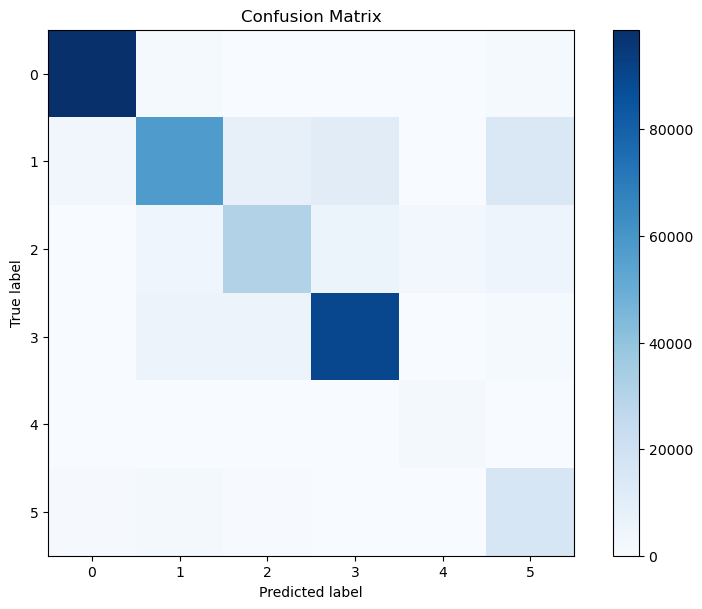

In [73]:
import numpy as np
from sklearn.metrics import confusion_matrix
import matplotlib.pyplot as plt

# Assuming you have already trained your model, evaluate it on your test data
_, acc = model.evaluate([X_test5,X_test7,X_test6,X_test13,X_test1,X_test2,X_test3,X_test4,X_test9,X_test10,X_test8,X_test12,X_test11], y_test_cat)
print("Accuracy is = ", (acc * 100.0), "%")

# Get the model predictions
predictions = model.predict([X_test5,X_test7,X_test6,X_test13,X_test1,X_test2,X_test3,X_test4,X_test9,X_test10,X_test8,X_test12,X_test11])

# Assuming 'y_test_cat' is one-hot encoded, convert it to integer labels
y_test = np.argmax(y_test_cat, axis=3).ravel()

# Flatten the predictions
predicted_labels = np.argmax(predictions, axis=3).ravel()

# Calculate the confusion matrix
confusion_matrix_result = confusion_matrix(y_test, predicted_labels)

# Display the confusion matrix as a heatmap
plt.figure(figsize=(8, 6))
plt.imshow(confusion_matrix_result, interpolation='nearest', cmap=plt.get_cmap('Blues'))
plt.title("Confusion Matrix")
plt.colorbar()
plt.tight_layout()

plt.ylabel('True label')
plt.xlabel('Predicted label')

# Show the confusion matrix
plt.show()


In [74]:
from sklearn.metrics import confusion_matrix, precision_score, recall_score, f1_score, accuracy_score

# Assuming you have already computed the confusion matrix as mentioned in the previous response
confusion_matrix_result = confusion_matrix(y_test, predicted_labels)

# Calculate precision, recall, and F1-score for each class
precision = precision_score(y_test, predicted_labels, average=None)
recall = recall_score(y_test, predicted_labels, average=None)
f1 = f1_score(y_test, predicted_labels, average=None)

# Calculate overall accuracy
accuracy = accuracy_score(y_test, predicted_labels)

# Print or display the metrics
for class_idx in range(6):  # Replace num_classes with the actual number of classes
    print(f"Class {class_idx} - Precision: {precision[class_idx]}, Recall: {recall[class_idx]}, F1-Score: {f1[class_idx]}")

print(f"Overall Accuracy: {accuracy}")

# You can also calculate and display the average metrics
average_precision = precision_score(y_test, predicted_labels, average='macro')
average_recall = recall_score(y_test, predicted_labels, average='macro')
average_f1 = f1_score(y_test, predicted_labels, average='macro')

print(f"Average Precision: {average_precision}, Average Recall: {average_recall}, Average F1-Score: {average_f1}")

Class 0 - Precision: 0.9552860088479298, Recall: 0.9705630686009343, F1-Score: 0.962863945047225
Class 1 - Precision: 0.8103634350428189, Recall: 0.6132152516306941, F1-Score: 0.6981380409582688
Class 2 - Precision: 0.6832574182992084, Recall: 0.6468568796968872, F1-Score: 0.664559071798015
Class 3 - Precision: 0.8476782408282012, Recall: 0.8732484820177487, F1-Score: 0.8602733948120171
Class 4 - Precision: 0.42167721518987344, Recall: 0.9884098284654613, F1-Score: 0.5911548592818523
Class 5 - Precision: 0.42582315945246024, Recall: 0.8063450760608487, F1-Score: 0.5573271538754194
Overall Accuracy: 0.8012912326388889
Average Precision: 0.6906809129434154, Average Recall: 0.8164397644120958, Average F1-Score: 0.7223860776287996


In [120]:
model.compile(optimizer='adam', loss='categorical_crossentropy', metrics=['accuracy'])

In [114]:
import random

# Generate two random test image numbers
test_img_number1 = random.randint(0, len(X_test1) - 1)
test_img_number2 = random.randint(0, len(X_test2) - 1)
test_img_number3 = random.randint(0, len(X_test3) - 1)
test_img_number4 = random.randint(0, len(X_test4) - 1)
test_img_number5 = random.randint(0, len(X_test5) - 1)
test_img_number6 = random.randint(0, len(X_test6) - 1)
test_img_number7 = random.randint(0, len(X_test7) - 1)
test_img_number8 = random.randint(0, len(X_test8) - 1)
test_img_number9 = random.randint(0, len(X_test9) - 1)
test_img_number10 = random.randint(0, len(X_test10) - 1)
test_img_number11 = random.randint(0, len(X_test11) - 1)
test_img_number12 = random.randint(0, len(X_test12) - 1)
test_img_number13 = random.randint(0, len(X_test13) - 1)





test_img1 = X_test1[test_img_number1]
test_img2 = X_test2[test_img_number2]
test_img3 = X_test3[test_img_number3]
test_img4 = X_test4[test_img_number4]
test_img5 = X_test5[test_img_number5]
test_img6 = X_test6[test_img_number6]
test_img7 = X_test7[test_img_number7]
test_img8 = X_test8[test_img_number8]
test_img8 = X_test9[test_img_number9]
test_img10 = X_test10[test_img_number10]
test_img11 = X_test11[test_img_number11]
test_img12 = X_test12[test_img_number12]
test_img13 = X_test13[test_img_number13]





ground_truth1 = y_test[test_img_number1]
ground_truth2 = y_test[test_img_number2]
ground_truth3 = y_test[test_img_number3]
ground_truth4 = y_test[test_img_number4]
ground_truth5 = y_test[test_img_number5]
ground_truth6 = y_test[test_img_number6]
ground_truth7 = y_test[test_img_number7]
ground_truth8 = y_test[test_img_number8]
ground_truth9 = y_test[test_img_number9]
ground_truth10 = y_test[test_img_number10]
ground_truth11 = y_test[test_img_number11]
ground_truth12 = y_test[test_img_number12]
ground_truth13 = y_test[test_img_number13]











# Preprocess the test images if necessary
test_img1_norm = test_img1[:, :, 0][:, :, None]
test_img2_norm = test_img2[:, :, 0][:, :, None]
test_img3_norm = test_img3[:, :, 0][:, :, None]
test_img4_norm = test_img4[:, :, 0][:, :, None]
test_img5_norm = test_img5[:, :, 0][:, :, None]
test_img6_norm = test_img6[:, :, 0][:, :, None]
test_img7_norm = test_img7[:, :, 0][:, :, None]
test_img8_norm = test_img8[:, :, 0][:, :, None]
test_img9_norm = test_img9[:, :, 0][:, :, None]
test_img10_norm = test_img10[:, :, 0][:, :, None]
test_img11_norm = test_img11[:, :, 0][:, :, None]
test_img12_norm = test_img12[:, :, 0][:, :, None]
test_img13_norm = test_img13[:, :, 0][:, :, None]





# Expand dimensions for model input
test_img1_input = np.expand_dims(test_img1_norm, 0)
test_img2_input = np.expand_dims(test_img2_norm, 0)
test_img3_input = np.expand_dims(test_img3_norm, 0)
test_img4_input = np.expand_dims(test_img4_norm, 0)
test_img5_input = np.expand_dims(test_img5_norm, 0)
test_img6_input = np.expand_dims(test_img6_norm, 0)
test_img7_input = np.expand_dims(test_img7_norm, 0)
test_img8_input = np.expand_dims(test_img8_norm, 0)
test_img9_input = np.expand_dims(test_img9_norm, 0)
test_img10_input = np.expand_dims(test_img10_norm, 0)
test_img11_input = np.expand_dims(test_img11_norm, 0)
test_img12_input = np.expand_dims(test_img12_norm, 0)
test_img13_input = np.expand_dims(test_img13_norm, 0)






# Make predictions using all 13 inputs
prediction1 = model.predict([test_img1_input, test_img2_input,test_img3_input, test_img4_input,test_img5_input, test_img6_input,test_img7_input, test_img8_input,test_img9_input,test_img10_input, test_img11_input,test_img12_input, test_img13_input])
predicted_img1 = np.argmax(prediction1, axis=3)[0, :, :]

# Display the first testing image and its prediction
plt.figure(figsize=(12, 8))
plt.subplot(231)
plt.title('Testing Image 1')
plt.imshow(test_img1[:, :, 0], cmap='gray')
plt.subplot(232)
plt.title('Testing Label 1')
plt.imshow(ground_truth1[:, :, 0], cmap='jet')
plt.subplot(233)
plt.title('Prediction on Test Image 1')
plt.imshow(predicted_img1, cmap='jet')

# Make predictions for the second image
prediction2 = model.predict([test_img2_input, test_img2_input] + dummy_inputs)
predicted_img2 = np.argmax(prediction2, axis=3)[0, :, :]

# Display the second testing image and its prediction
plt.subplot(234)
plt.title('Testing Image 2')
plt.imshow(test_img2[:, :, 0], cmap='gray')
plt.subplot(235)
plt.title('Testing Label 2')
plt.imshow(ground_truth2[:, :, 0], cmap='jet')
plt.subplot(236)
plt.title('Prediction on Test Image 2')
plt.imshow(predicted_img2, cmap='jet')

plt.show()


ValueError: in user code:

    File "C:\Users\mrg22-020914479\.conda\envs\TestDL\Lib\site-packages\keras\src\engine\training.py", line 2341, in predict_function  *
        return step_function(self, iterator)
    File "C:\Users\mrg22-020914479\.conda\envs\TestDL\Lib\site-packages\keras\src\engine\training.py", line 2327, in step_function  **
        outputs = model.distribute_strategy.run(run_step, args=(data,))
    File "C:\Users\mrg22-020914479\.conda\envs\TestDL\Lib\site-packages\keras\src\engine\training.py", line 2315, in run_step  **
        outputs = model.predict_step(data)
    File "C:\Users\mrg22-020914479\.conda\envs\TestDL\Lib\site-packages\keras\src\engine\training.py", line 2283, in predict_step
        return self(x, training=False)
    File "C:\Users\mrg22-020914479\.conda\envs\TestDL\Lib\site-packages\keras\src\utils\traceback_utils.py", line 70, in error_handler
        raise e.with_traceback(filtered_tb) from None
    File "C:\Users\mrg22-020914479\.conda\envs\TestDL\Lib\site-packages\keras\src\engine\input_spec.py", line 219, in assert_input_compatibility
        raise ValueError(

    ValueError: Layer "model_2" expects 2 input(s), but it received 13 input tensors. Inputs received: [<tf.Tensor 'IteratorGetNext:0' shape=(None, 64, 64, 1) dtype=float32>, <tf.Tensor 'IteratorGetNext:1' shape=(None, 64, 64, 1) dtype=float32>, <tf.Tensor 'IteratorGetNext:2' shape=(None, 64, 64, 1) dtype=float32>, <tf.Tensor 'IteratorGetNext:3' shape=(None, 64, 64, 1) dtype=float32>, <tf.Tensor 'IteratorGetNext:4' shape=(None, 64, 64, 1) dtype=float32>, <tf.Tensor 'IteratorGetNext:5' shape=(None, 64, 64, 1) dtype=float32>, <tf.Tensor 'IteratorGetNext:6' shape=(None, 64, 64, 1) dtype=float32>, <tf.Tensor 'IteratorGetNext:7' shape=(None, 64, 64, 1) dtype=float32>, <tf.Tensor 'IteratorGetNext:8' shape=(None, 64, 64, 1) dtype=float32>, <tf.Tensor 'IteratorGetNext:9' shape=(None, 64, 64, 1) dtype=float32>, <tf.Tensor 'IteratorGetNext:10' shape=(None, 64, 64, 1) dtype=float32>, <tf.Tensor 'IteratorGetNext:11' shape=(None, 64, 64, 1) dtype=float32>, <tf.Tensor 'IteratorGetNext:12' shape=(None, 64, 64, 1) dtype=float32>]


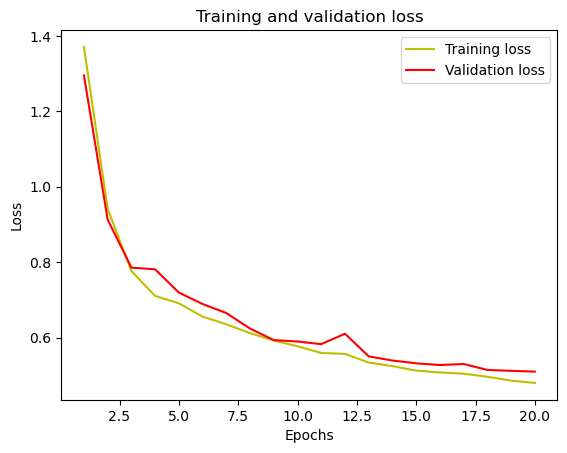

In [75]:
#plot the training and validation accuracy and loss at each epoch
loss = history.history['loss']
val_loss = history.history['val_loss']
epochs = range(1, len(loss) + 1)
plt.plot(epochs, loss, 'y', label='Training loss')
plt.plot(epochs, val_loss, 'r', label='Validation loss')
plt.title('Training and validation loss')
plt.xlabel('Epochs')
plt.ylabel('Loss')
plt.legend()
plt.show()

In [76]:
acc = history.history['accuracy']
val_acc = history.history['val_accuracy']

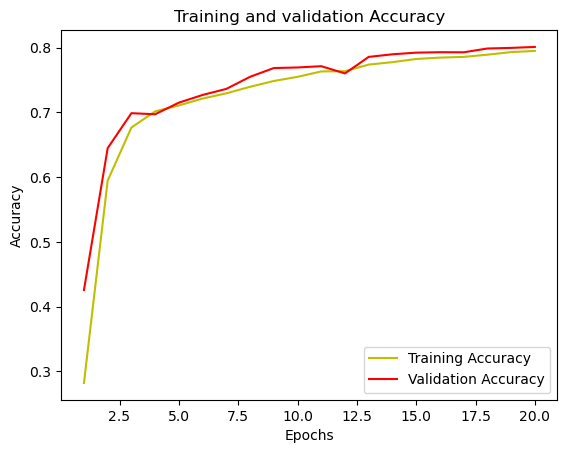

In [77]:
plt.plot(epochs, acc, 'y', label='Training Accuracy')
plt.plot(epochs, val_acc, 'r', label='Validation Accuracy')
plt.title('Training and validation Accuracy')
plt.xlabel('Epochs')
plt.ylabel('Accuracy')
plt.legend()
plt.show()

3/3 [==============================] - 1s 443ms/step


IndexError: invalid index to scalar variable.

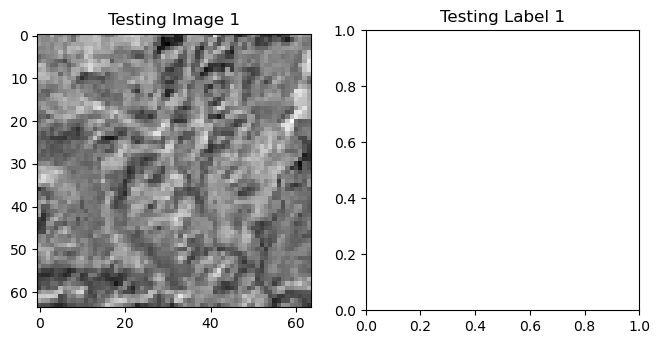

In [78]:
import random

# Generate two random test image numbers
test_img_number1 = random.randint(0, len(X_test1) - 1)
test_img_number2 = random.randint(0, len(X_test2) - 1)
test_img_number3 = random.randint(0, len(X_test3) - 1)
test_img_number4 = random.randint(0, len(X_test4) - 1)
test_img_number5 = random.randint(0, len(X_test5) - 1)
test_img_number6 = random.randint(0, len(X_test6) - 1)
test_img_number7 = random.randint(0, len(X_test7) - 1)
test_img_number8 = random.randint(0, len(X_test8) - 1)
test_img_number9 = random.randint(0, len(X_test9) - 1)
test_img_number10 = random.randint(0, len(X_test10) - 1)
test_img_number11 = random.randint(0, len(X_test11) - 1)
test_img_number12 = random.randint(0, len(X_test12) - 1)
test_img_number13 = random.randint(0, len(X_test13) - 1)


test_img1 = X_test1[test_img_number1]
test_img2 = X_test2[test_img_number2]
test_img3 = X_test3[test_img_number3]
test_img4 = X_test4[test_img_number4]
test_img5 = X_test5[test_img_number5]
test_img6 = X_test6[test_img_number6]
test_img7 = X_test7[test_img_number7]
test_img8 = X_test8[test_img_number8]
test_img9 = X_test9[test_img_number9]
test_img10 = X_test10[test_img_number10]
test_img11 = X_test11[test_img_number11]
test_img12 = X_test12[test_img_number12]
test_img13 = X_test13[test_img_number13]

ground_truth1 = y_test[test_img_number1]
ground_truth2 = y_test[test_img_number2]

# Preprocess the test images if necessary
test_img1_norm = test_img1[:, :, 0][:, :, None]
test_img2_norm = test_img2[:, :, 0][:, :, None]
test_img3_norm = test_img3[:, :, 0][:, :, None]
test_img4_norm = test_img4[:, :, 0][:, :, None]
test_img5_norm = test_img5[:, :, 0][:, :, None]
test_img6_norm = test_img6[:, :, 0][:, :, None]
test_img7_norm = test_img7[:, :, 0][:, :, None]
test_img8_norm = test_img8[:, :, 0][:, :, None]
test_img9_norm = test_img9[:, :, 0][:, :, None]
test_img10_norm = test_img10[:, :, 0][:, :, None]
test_img11_norm = test_img11[:, :, 0][:, :, None]
test_img12_norm = test_img12[:, :, 0][:, :, None]
test_img13_norm = test_img13[:, :, 0][:, :, None]



# Expand dimensions for model input
test_img1_input = np.expand_dims(test_img1_norm, 0)
test_img2_input = np.expand_dims(test_img2_norm, 0)
test_img3_input = np.expand_dims(test_img3_norm, 0)
test_img4_input = np.expand_dims(test_img4_norm, 0)
test_img5_input = np.expand_dims(test_img5_norm, 0)
test_img6_input = np.expand_dims(test_img6_norm, 0)
test_img7_input = np.expand_dims(test_img7_norm, 0)
test_img8_input = np.expand_dims(test_img8_norm, 0)
test_img9_input = np.expand_dims(test_img9_norm, 0)
test_img10_input = np.expand_dims(test_img10_norm, 0)
test_img11_input = np.expand_dims(test_img11_norm, 0)
test_img12_input = np.expand_dims(test_img12_norm, 0)
test_img13_input = np.expand_dims(test_img13_norm, 0)







# Make predictions using both inputs
prediction1 = model.predict([X_test5,X_test7,X_test6,X_test13,X_test1,X_test2,X_test3,X_test4,X_test9,X_test10,X_test8,X_test12,X_test11])
predicted_img1 = np.argmax(prediction1, axis=3)[0, :, :]

# Display the first testing image and its prediction
plt.figure(figsize=(12, 8))
plt.subplot(231)
plt.title('Testing Image 1')
plt.imshow(test_img1[:, :, 0], cmap='gray')
plt.subplot(232)
plt.title('Testing Label 1')
plt.imshow(ground_truth1[:, :, 0], cmap='jet')
plt.subplot(233)
plt.title('Prediction on Test Image 1')
plt.imshow(predicted_img1, cmap='jet')

# Make predictions for the second image
prediction2 = model.predict([X_test5,X_test7,X_test6,X_test13,X_test1,X_test2,X_test3,X_test4,X_test9,X_test10,X_test8,X_test12,X_test11])
predicted_img2 = np.argmax(prediction2, axis=3)[0, :, :]

# Display the second testing image and its prediction
plt.subplot(234)
plt.title('Testing Image 2')
plt.imshow(test_img2[:, :, 0], cmap='gray')
plt.subplot(235)
plt.title('Testing Label 2')
plt.imshow(ground_truth2[:, :, 0], cmap='jet')
plt.subplot(236)
plt.title('Prediction on Test Image 2')
plt.imshow(predicted_img2, cmap='jet')

plt.show()

In [602]:
import patchify
from patchify import patchify, unpatchify

In [603]:
pred_ndvi = 'D:/Jintu/Jintu_ShareFolder/TestDL_3/DL_Prediction/1990/NDVI_Landsat_1990_01_NDVI.tif.tif'
pred_ndwi = 'D:/Jintu/Jintu_ShareFolder/TestDL_3/DL_Prediction/1990/NDWI_Landsat_1990_01_NDWI.tif.tif'
pred_evi='D:/Jintu/Jintu_ShareFolder/TestDL_3/DL_Prediction/1990/EVI_Landsat_1990_01_EVI.tif.tif'
pred_nir='D:/Jintu/Jintu_ShareFolder/TestDL_3/DL_Prediction/1990/Landsat_Landsat_1990_01_NIR.tif.tif'
pred_red='D:/Jintu/Jintu_ShareFolder/TestDL_3/DL_Prediction/1990/Landsat_Landsat_1990_01_RED.tif.tif'
pred_swir='D:/Jintu/Jintu_ShareFolder/TestDL_3/DL_Prediction/1990/Landsat_Landsat_1990_01_SWIR.tif.tif'
pred_tir='D:/Jintu/Jintu_ShareFolder/TestDL_3/DL_Prediction/1990/Landsat_Landsat_1990_01_TIRS.tif.tif'
pred_cont='D:/Jintu/Jintu_ShareFolder/TestDL_3/DL_Prediction/1990/GLCM_contrast_1990.tif.tif'
pred_diss='D:/Jintu/Jintu_ShareFolder/TestDL_3/DL_Prediction/1990/GLCM_dissimilarity_1990.tif.tif'
pred_corr='D:/Jintu/Jintu_ShareFolder/TestDL_3/DL_Prediction/1990/GLCM_correlation_1990.tif.tif'
pred_slp='D:/Jintu/Jintu_ShareFolder/TestDL_3/DL_Prediction/1990/Slope.tif'
pred_asp='D:/Jintu/Jintu_ShareFolder/TestDL_3/DL_Prediction/1990/Aspect.tif'
pred_elv='D:/Jintu/Jintu_ShareFolder/TestDL_3/DL_Prediction/1990/Elevation.tif'


In [604]:
import rasterio
import numpy as np
from patchify import patchify

# Paths to the prediction input images
pred_paths = [pred_nir, pred_red, pred_swir, pred_tir, pred_ndvi, pred_ndwi, pred_evi, pred_cont, pred_diss, pred_corr, pred_slp, pred_asp, pred_elv]

# Open the images using rasterio
pred_images = []
for pred_path in pred_paths:
    with rasterio.open(pred_path) as pred_dataset:
        # Read image data as numpy arrays
        pred_image = pred_dataset.read(1)
        pred_images.append(pred_image)

# Crop all input images to a size that is divisible by 256x256
patch_size = (128, 128)
SIZE_X = (min(image.shape[1] for image in pred_images) // patch_size[1]) * patch_size[1]
SIZE_Y = (min(image.shape[0] for image in pred_images) // patch_size[0]) * patch_size[0]

pred_images_cropped = [image[:SIZE_Y, :SIZE_X] for image in pred_images]

# Patchify the cropped input images
patchified_images = [patchify(image_cropped, patch_size, 128) for image_cropped in pred_images_cropped]

# Initialize an empty list to store the predicted patches
predicted_patches = []

# Loop through the patches and make predictions
for i in range(patchified_images[0].shape[0]):
    for j in range(patchified_images[0].shape[1]):
        print(i, j)

        # Extract individual patches from all input images
        input_patches = []
        for image_patches in patchified_images:
            patch = image_patches[i, j, :, :]
            patch_norm = np.expand_dims(normalize(np.array(patch), axis=1), 2)
            input_patches.append(patch_norm)

        # Expand dimensions and prepare the input for the model
        patch_input = [np.expand_dims(patch, 0) for patch in input_patches]

        # Make predictions using your model
        patch_prediction = model.predict(patch_input)

        # Extract the predicted image
        patch_predicted_img = np.argmax(patch_prediction, axis=3)[0, :, :]

        # Append the predicted patch to the list
        predicted_patches.append(patch_predicted_img)

# Now you have the list of predicted patches, you can further process and visualize them as needed.


0 0
1/1 [==============================] - 1s 1s/step
0 1
1/1 [==============================] - 1s 975ms/step
0 2
1/1 [==============================] - 1s 1s/step
0 3
1/1 [==============================] - 1s 1s/step
0 4
1/1 [==============================] - 1s 1s/step
0 5
1/1 [==============================] - 1s 1s/step
0 6
1/1 [==============================] - 1s 996ms/step
0 7
1/1 [==============================] - 1s 1s/step
0 8
1/1 [==============================] - 1s 1s/step
0 9
1/1 [==============================] - 1s 1s/step
0 10
1/1 [==============================] - 1s 1s/step
0 11
1/1 [==============================] - 1s 1s/step
0 12
1/1 [==============================] - 1s 990ms/step
0 13
1/1 [==============================] - 1s 980ms/step
0 14
1/1 [==============================] - 1s 1s/step
0 15
1/1 [==============================] - 1s 1s/step
0 16
1/1 [==============================] - 1s 1s/step
0 17
1/1 [==============================] - 1s 1s/step
0 18
1/1

In [605]:
# Convert the list of predicted patches to a NumPy array
predicted_patches = np.array(predicted_patches)

In [606]:
# Reshape the predicted patches to match the original shape
predicted_patches_reshaped = np.reshape(predicted_patches, (patchified_images[0].shape[0], patchified_images[0].shape[1], 128, 128))

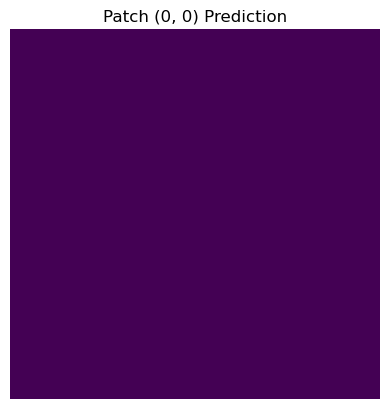

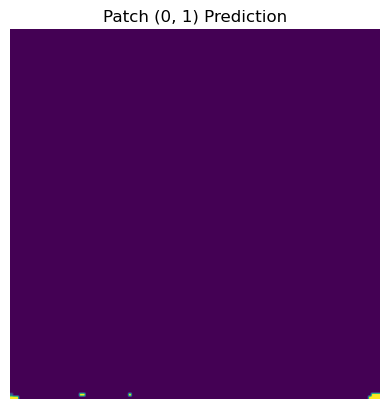

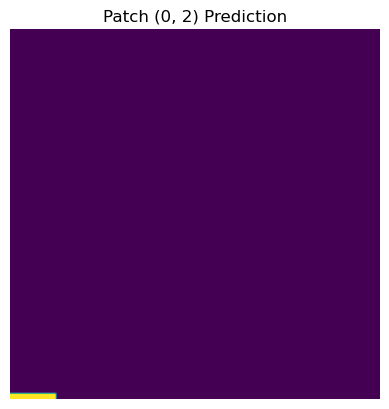

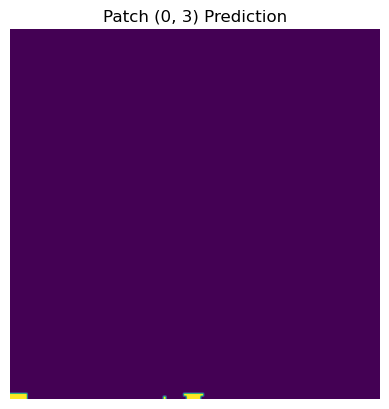

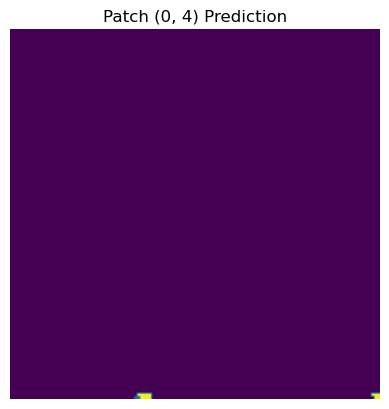

...

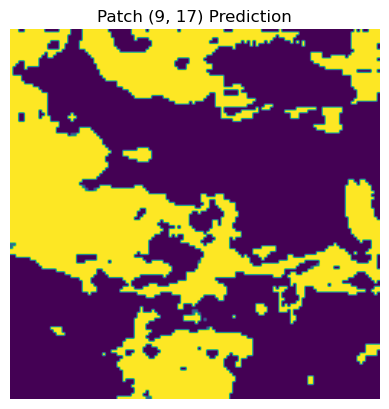

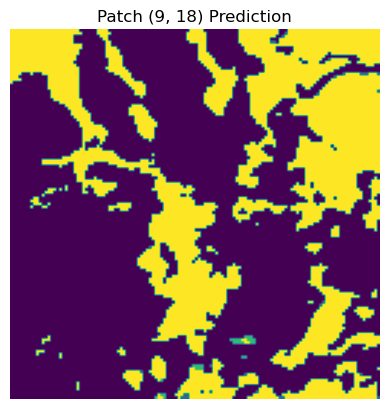

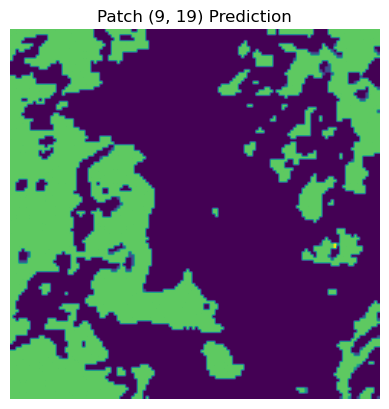

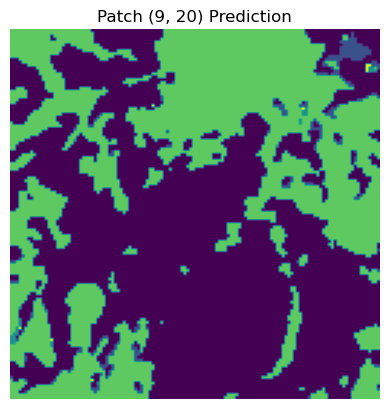

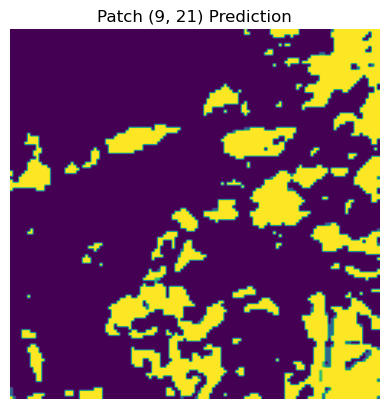

In [607]:
# Loop through the reshaped predicted patches and plot them
for i in range(predicted_patches_reshaped.shape[0]):
    for j in range(predicted_patches_reshaped.shape[1]):
        plt.figure()
        plt.imshow(predicted_patches_reshaped[i, j], cmap='viridis')  # Assuming grayscale images
        plt.title(f'Patch ({i}, {j}) Prediction')
        plt.axis('off')
        plt.show()

In [611]:
 reconstructed_image = unpatchify(predicted_patches_reshaped, (SIZE_Y, SIZE_X))

In [612]:
print(reconstructed_image.shape)

(1280, 2816)


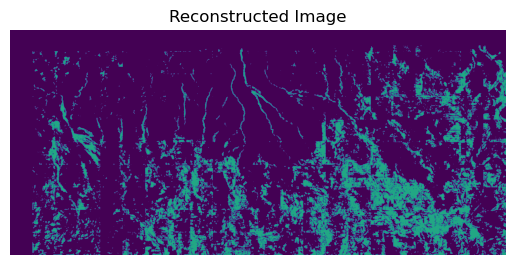

In [613]:
# Show the reconstructed image
plt.imshow(reconstructed_image, cmap='viridis')  # Assuming grayscale
plt.title('Reconstructed Image')
plt.axis('off')
plt.show()

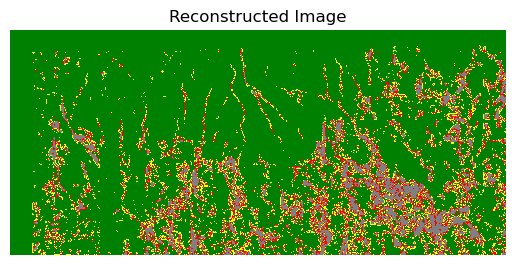

(1, 1280, 2816)


In [618]:
from patchify import unpatchify

# Reconstruct the image from predicted patches
reconstructed_image = unpatchify(predicted_patches_reshaped, (SIZE_Y, SIZE_X))



# You can choose preferable colors for each class
class_colors = {
    1: 'green',         # Class 1: Forest
    2: 'yellow',         # Class 2: Tea Garden
    3: 'red',           # Class 3: Settlement
    4: 'gray',          # Class 4: Barren Land
    5: 'blue',          # Class 5: Water Body
    6: 'orange'         # Class 6: Home Garden
}


# Create a colormap with specific colors
cmap = mcolors.ListedColormap([class_colors[i] for i in sorted(class_colors.keys())])


# Assuming reconstructed_image has shape (1280, 2816)
reconstructed_image = np.expand_dims(reconstructed_image, axis=0)


# Show the reconstructed image
plt.imshow(reconstructed_image[0], cmap=cmap)  # Assuming grayscale
plt.title('Reconstructed Image')
plt.axis('off')
plt.show()

# Print the updated shape of the reconstructed image
print(reconstructed_image.shape)


In [426]:
print(reconstructed_image.shape)

(1, 1280, 2816)


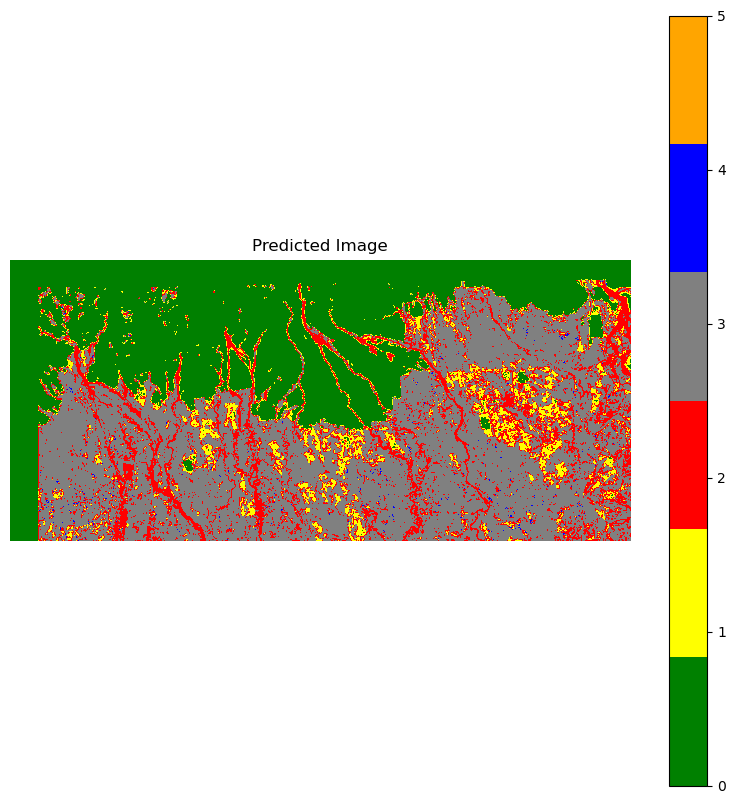

In [616]:
import rasterio
import matplotlib.pyplot as plt

# Specify the output file path
output_tiff_path = 'D:/Jintu/Jintu_ShareFolder/TestDL_3/DL_Prediction/1990/Predicted Image/output_reconstructed_image.tif'

# Load the output image using rasterio
with rasterio.open(output_tiff_path) as output_dataset:
    output_image = output_dataset.read(1)

# You can choose preferable colors for each class
class_colors = {
    1: 'green',         # Class 1: Forest
    2: 'yellow',        # Class 2: Tea Garden
    3: 'red',           # Class 3: Settlement
    4: 'gray',          # Class 4: Barren Land
    5: 'blue',          # Class 5: Water Body
    6: 'orange'         # Class 6: Home Garden
}

# Create a colormap with specific colors
cmap = plt.cm.colors.ListedColormap([class_colors[i] for i in sorted(class_colors.keys())])

# Plot and display the output image
plt.figure(figsize=(10, 10))
plt.imshow(output_image, cmap=cmap)
plt.title('Predicted Image')
plt.colorbar()
plt.axis('off')

# Save the plot as an image (optional)
# plt.savefig('predicted_image_plot.png', bbox_inches='tight')

# Show the plot
plt.show()


In [427]:
import rasterio

# Specify the output file path
output_tiff_path = 'D:/Jintu/Jintu_ShareFolder/TestDL_3/DL_Prediction/1990/Predicted Image/output_reconstructed_image.tif'

# Update the shape of reconstructed_image (remove the first dimension)
reconstructed_image = reconstructed_image[0, :, :]

# Export options
export_options = {
    'driver': 'GTiff',  # GeoTIFF format
    'height': reconstructed_image.shape[0],
    'width': reconstructed_image.shape[1],
    'count': 1,  # Number of bands (assuming it's a single-band image)
    'dtype': reconstructed_image.dtype,  # Data type of the image (e.g., np.uint8)
    'crs': 'EPSG:32644',  # Change to your desired CRS
    # 'transform': pred_ndvi.transform,  # Use the transform from the original dataset
}

# Create a new GeoTIFF file and write the reconstructed image data to it
with rasterio.open(output_tiff_path, 'w', **export_options) as dst:
    dst.write(reconstructed_image, 1)  # Use band index 1

# Check the saved file
with rasterio.open(output_tiff_path) as src:
    print(src.profile)



{'driver': 'GTiff', 'dtype': 'int64', 'nodata': None, 'width': 2816, 'height': 1280, 'count': 1, 'crs': CRS.from_epsg(32644), 'transform': Affine(1.0, 0.0, 0.0,
       0.0, 1.0, 0.0), 'blockysize': 1, 'tiled': False, 'interleave': 'band'}


In [462]:
pred_nir_folder= "D:/Jintu/Jintu_ShareFolder/TestDL_3/DL_Prediction/NIR"
pred_red_folder="D:/Jintu/Jintu_ShareFolder/TestDL_3/DL_Prediction/RED"
pred_swir_folder="D:/Jintu/Jintu_ShareFolder/TestDL_3/DL_Prediction/SWIR"
pred_tir_folder="D:/Jintu/Jintu_ShareFolder/TestDL_3/DL_Prediction/TIRS"
pred_ndvi_folder="D:/Jintu/Jintu_ShareFolder/TestDL_3/DL_Prediction/NDVI"
pred_ndwi_folder="D:/Jintu/Jintu_ShareFolder/TestDL_3/DL_Prediction/NDWI"
pred_evi_folder="D:/Jintu/Jintu_ShareFolder/TestDL_3/DL_Prediction/EVI"
pred_cont_folder ="D:/Jintu/Jintu_ShareFolder/TestDL_3/DL_Prediction/CONTRAST"
pred_diss_folder="D:/Jintu/Jintu_ShareFolder/TestDL_3/DL_Prediction/DISSIMILARITY"
pred_corr_folder="D:/Jintu/Jintu_ShareFolder/TestDL_3/DL_Prediction/CORRELATION"
pred_slp_folder="D:/Jintu/Jintu_ShareFolder/TestDL_3/DL_Prediction/SLOPE"
pred_asp_folder="D:/Jintu/Jintu_ShareFolder/TestDL_3/DL_Prediction/ASPECT"
pred_elv_folder="D:/Jintu/Jintu_ShareFolder/TestDL_3/DL_Prediction/ELEVATION"

In [547]:
import rasterio
import numpy as np
from patchify import patchify
from patchify import unpatchify
import matplotlib.pyplot as plt
import matplotlib.colors as mcolors

def predict_and_reconstruct(input_paths, model, patch_size=(128, 128)):
    # Open the images using rasterio
    input_images = []
    for input_path in input_paths:
        with rasterio.open(input_path) as input_dataset:
            # Read image data as numpy arrays
            input_image = input_dataset.read(1)
            input_images.append(input_image)

    # Crop all input images to a size that is divisible by patch_size
    SIZE_X = (min(image.shape[1] for image in input_images) // patch_size[1]) * patch_size[1]
    SIZE_Y = (min(image.shape[0] for image in input_images) // patch_size[0]) * patch_size[0]

    input_images_cropped = [image[:SIZE_Y, :SIZE_X] for image in input_images]

    # Patchify the cropped input images
    patchified_images = [patchify(image_cropped, patch_size, 128) for image_cropped in input_images_cropped]

    # Initialize an empty list to store the predicted patches
    predicted_patches = []

    # Loop through the patches and make predictions
    for i in range(patchified_images[0].shape[0]):
        for j in range(patchified_images[0].shape[1]):
            # Extract individual patches from all input images
            input_patches = []
            for image_patches in patchified_images:
                patch = image_patches[i, j, :, :]
                patch_norm = np.expand_dims(normalize(np.array(patch), axis=1), 2)
                input_patches.append(patch_norm)

            # Expand dimensions and prepare the input for the model
            patch_input = [np.expand_dims(patch, 0) for patch in input_patches]

            # Make predictions using your model
            patch_prediction = model.predict(patch_input)

            # Extract the predicted image
            patch_predicted_img = np.argmax(patch_prediction, axis=3)[0, :, :]

            # Append the predicted patch to the list
            predicted_patches.append(patch_predicted_img)

    # Convert the list of predicted patches to a NumPy array
    predicted_patches = np.array(predicted_patches)

    # Reshape the predicted patches to match the original shape
    predicted_patches_reshaped = np.reshape(predicted_patches, (patchified_images[0].shape[0], patchified_images[0].shape[1], patch_size[0], patch_size[1]))

    # Reconstruct the image from predicted patches
    reconstructed_image = unpatchify(predicted_patches_reshaped, (SIZE_Y, SIZE_X))

    # You can choose preferable colors for each class
    class_colors = {
        1: 'green',         # Class 1: Forest
        2: 'yellow',        # Class 2: Tea Garden
        3: 'red',           # Class 3: Settlement
        4: 'gray',          # Class 4: Barren Land
        5: 'blue',          # Class 5: Water Body
        6: 'orange'         # Class 6: Home Garden
    }

    # Create a colormap with specific colors
    cmap = mcolors.ListedColormap([class_colors[i] for i in sorted(class_colors.keys())])

    # Assuming reconstructed_image has shape (height, width)
    plt.imshow(reconstructed_image, cmap=cmap)
    plt.title('Reconstructed Image')
    plt.axis('off')
    plt.show()

    # Print the updated shape of the reconstructed image
    print(reconstructed_image.shape)

# Example usage:
# Replace 'input_paths' with your list of file paths
# Replace 'your_model' with your trained model
# predict_and_reconstruct(input_paths, your_model)


1/1 [==============================] - 1s 915ms/step


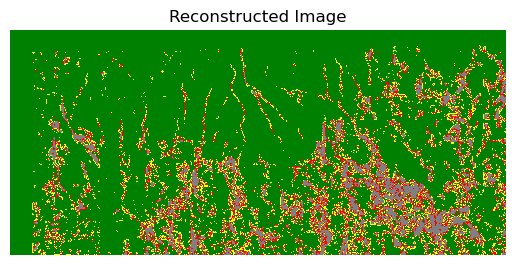

(1280, 2816)


In [551]:
# List of file paths
file_paths = [
    'D:/Jintu/Jintu_ShareFolder/TestDL_3/DL_Prediction/1990/Landsat_Landsat_1990_01_NIR.tif.tif',
    'D:/Jintu/Jintu_ShareFolder/TestDL_3/DL_Prediction/1990/Landsat_Landsat_1990_01_RED.tif.tif',
    'D:/Jintu/Jintu_ShareFolder/TestDL_3/DL_Prediction/1990/Landsat_Landsat_1990_01_SWIR.tif.tif',
    'D:/Jintu/Jintu_ShareFolder/TestDL_3/DL_Prediction/1990/Landsat_Landsat_1990_01_TIRS.tif.tif',
    'D:/Jintu/Jintu_ShareFolder/TestDL_3/DL_Prediction/1990/NDVI_Landsat_1990_01_NDVI.tif.tif',
    'D:/Jintu/Jintu_ShareFolder/TestDL_3/DL_Prediction/1990/NDWI_Landsat_1990_01_NDWI.tif.tif',
    'D:/Jintu/Jintu_ShareFolder/TestDL_3/DL_Prediction/1990/EVI_Landsat_1990_01_EVI.tif.tif',
    'D:/Jintu/Jintu_ShareFolder/TestDL_3/DL_Prediction/1990/GLCM_contrast_1990.tif.tif',
    'D:/Jintu/Jintu_ShareFolder/TestDL_3/DL_Prediction/1990/GLCM_dissimilarity_1990.tif.tif',
    'D:/Jintu/Jintu_ShareFolder/TestDL_3/DL_Prediction/1990/GLCM_correlation_1990.tif.tif',
    'D:/Jintu/Jintu_ShareFolder/TestDL_3/DL_Prediction/1990/Slope.tif',
    'D:/Jintu/Jintu_ShareFolder/TestDL_3/DL_Prediction/1990/Aspect.tif',
    'D:/Jintu/Jintu_ShareFolder/TestDL_3/DL_Prediction/1990/Elevation.tif'
]

# Call the predict_and_reconstruct function
model=model
predict_and_reconstruct(file_paths, model)


In [550]:
print('k')

k
